# NYC Taxi Duration Prediction (KAGGLE)
## 1. Постановка задачи

Нам предстоит решить настоящую задачу машинного обучения, направленную на автоматизацию бизнес процессов. Мы построим модель, которая будет предсказывать общую продолжительность поездки такси в Нью-Йорке. 

Представим, мы заказываем такси из одной точки Нью-Йорка в другую, причем не обязательно конечная точка должна находиться в пределах города. Сколько мы должны будем за нее заплатить? Известно, что стоимость такси в США  рассчитывается на основе фиксированной ставки + тарифная стоимость, величина которой зависит от времени и расстояния. Тарифы варьируются в зависимости от города.

В свою очередь время поездки зависит от множества факторов таких как, откуда и куда мы едем, в какое время суток мы совершаем нашу поездку, погодных условий и так далее. 

Таким образом, если мы разработаем алгоритм, способный определять длительность поездки, мы сможем прогнозировать ее стоимость самым тривиальным образом, например, просто умножая стоимость на заданный тариф. 
Сервисы такси хранят огромные объёмы информации о поездках, включая такие данные как конечная, начальная точка маршрута, дата поездки и ее длительность. Эти данные можно использовать для того, чтобы прогнозировать длительность поездки в автоматическом режиме с привлечением искусственного интеллекта.

**Бизнес-задача:** определить характеристики и с их помощью спрогнозировать длительность поездки такси.

**Техническая задача для нас как для специалиста в Data Science:** построить модель машинного обучения, которая на основе предложенных характеристик клиента будет предсказывать числовой признак - время поездки такси. То есть решить задачу регрессии.

**Основные цели проекта:**
1. Сформировать набор данных на основе нескольких источников информации
2. Спроектировать новые признаки с помощью Feature Engineering и выявить наиболее значимые при построении модели
3. Исследовать предоставленные данные и выявить закономерности
4. Построить несколько моделей и выбрать из них наилучшую по заданной метрике
5. Спроектировать процесс предсказания времени длительности поездки для новых данных


## 2. Знакомство с данными, базовый анализ и расширение данных

Начнём наше исследование со знакомства с предоставленными данными. А также подгрузим дополнительные источники данных и расширим наш исходный датасет. 


Заранее импортируем модули, которые нам понадобятся для решения задачи:

In [198]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from scipy import stats
from sklearn.linear_model import  LinearRegression, Ridge
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, PolynomialFeatures
from sklearn import model_selection
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, median_absolute_error
from sklearn import cluster
from sklearn.feature_selection import SelectKBest, f_regression

import xgboost as xgb
import lightgbm as lgbm

In [199]:
# PX_MODE = None
PX_MODE = 'svg'
RANDOM_STATE = 42

Прочитаем наш файл с исходными данными:

(это тренировочная часть данных, тестовая часть находится в отдельном файле, загрузим ее позже)

In [200]:
taxi_data = pd.read_csv("data/train.csv")  
print('Train data shape: {}'.format(taxi_data.shape))
taxi_data.head()

Train data shape: (1458644, 11)


,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


Итак, у нас с вами есть данные о почти 1.5 миллионах поездок и 11 характеристиках, которые описывают каждую из поездок. 

Мы условно разделили признаки нескольких групп. Каждой из групп мы в дальнейшем уделим отдельное внимание.

**Данные о клиенте и таксопарке:**
* id - уникальный идентификатор поездки
* vendor_id - уникальный идентификатор поставщика (таксопарка), связанного с записью поездки

**Временные характеристики:**
* pickup_datetime - дата и время, когда был включен счетчик поездки
* dropoff_datetime - дата и время, когда счетчик был отключен

**Географическая информация:**
* pickup_longitude -  долгота, на которой был включен счетчик
* pickup_latitude - широта, на которой был включен счетчик
* dropoff_longitude - долгота, на которой счетчик был отключен
* dropoff_latitude - широта, на которой счетчик был отключен

**Прочие признаки:**
* passenger_count - количество пассажиров в транспортном средстве (введенное водителем значение)
* store_and_fwd_flag - флаг, который указывает, сохранилась ли запись о поездке в памяти транспортного средства перед отправкой поставщику. Y - хранить и пересылать, N - не хранить и не пересылать поездку.

**Целевой признак:**
* trip_duration - продолжительность поездки в секундах


Для начала мы проведем базовый анализ того, насколько данные готовы к дальнейшей предобработке и анализу. 

Для начала посмотрим на временные рамки, в которых мы работаем с данными.

Переведем признак pickup_datetime в тип данных datetime с форматом год-месяц-день час:минута:секунда (в функции pd.to_datetime() параметр format='%Y-%m-%d %H:%M:%S'). 

Определим временные рамки (без учета времени), за которые представлены данные.

In [201]:
taxi_data['pickup_datetime']= pd.to_datetime(taxi_data['pickup_datetime'], format='%Y-%m-%d %H:%M:%S')
taxi_data['dropoff_datetime'] = pd.to_datetime(taxi_data['dropoff_datetime'], format='%Y-%m-%d %H:%M:%S')
taxi_data[['pickup_datetime', 'dropoff_datetime']].describe()

,pickup_datetime,dropoff_datetime
count,1458644,1458644
mean,2016-04-01 10:10:24.940037120,2016-04-01 10:26:24.432310528
min,2016-01-01 00:00:17,2016-01-01 00:03:31
25%,2016-02-17 16:46:04.249999872,2016-02-17 17:05:32.500000
50%,2016-04-01 17:19:40,2016-04-01 17:35:12
75%,2016-05-15 03:56:08.750000128,2016-05-15 04:10:51.750000128
max,2016-06-30 23:59:39,2016-07-01 23:02:03


Посмотрим на пропуски. 

In [202]:
display(taxi_data.isna().sum())
taxi_data.info()

id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   id                  1458644 non-null  object        
 1   vendor_id           1458644 non-null  int64         
 2   pickup_datetime     1458644 non-null  datetime64[ns]
 3   dropoff_datetime    1458644 non-null  datetime64[ns]
 4   passenger_count     1458644 non-null  int64         
 5   pickup_longitude    1458644 non-null  float64       
 6   pickup_latitude     1458644 non-null  float64       
 7   dropoff_longitude   1458644 non-null  float64       
 8   dropoff_latitude    1458644 non-null  float64       
 9   store_and_fwd_flag  1458644 non-null  object        
 10  trip_duration       1458644 non-null  int64         
dtypes: datetime64[ns](2), float64(4), int64(3), object(2)
memory usage: 122.4+ MB


Посмотрим на статистические характеристики некоторых признаков. 

а) Сколько уникальных таксопарков присутствует в данных?

б) Каково максимальное количество пассажиров?

в) Чему равна средняя и медианная длительность поездки? 

г) Чему равно минимальное и максимальное время поездки (в секундах)?


In [203]:
taxi_data.describe()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1458644,1458644,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.534950e+00,2016-04-01 10:10:24.940037120,2016-04-01 10:26:24.432310528,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
min,1.000000e+00,2016-01-01 00:00:17,2016-01-01 00:03:31,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,2016-02-17 16:46:04.249999872,2016-02-17 17:05:32.500000,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,2.000000e+00,2016-04-01 17:19:40,2016-04-01 17:35:12,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,2016-05-15 03:56:08.750000128,2016-05-15 04:10:51.750000128,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,2.000000e+00,2016-06-30 23:59:39,2016-07-01 23:02:03,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06
std,4.987772e-01,NaN,NaN,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03


In [204]:
taxi_data.nunique()

id                    1458644
vendor_id                   2
pickup_datetime       1380222
dropoff_datetime      1380377
passenger_count            10
pickup_longitude        23047
pickup_latitude         45245
dropoff_longitude       33821
dropoff_latitude        62519
store_and_fwd_flag          2
trip_duration            7417
dtype: int64

В данных присутствуют поездки, продолжительность которых составляет одну секунду, а также поездки, продолжительность которых больше 40 дней. Сразу приходит мысль, что это выбросы.

Чтобы однозначно обозначить такие записи в таблице как выбросы, нам необходимо произвести более глубокий анализ данных с подключением дополнительной информации. Выполним это позже.

Займемся расширением исходного набора данных как с помощью внешних источников, так и с помощью манипуляций над имеющимися в данных признаками. 


Реализуем функцию add_datetime_features(), которая принимает на вход таблицу с данными о поездках (DataFrame) и возвращает ту же таблицу с добавленными в нее 3 столбцами:
* pickup_date - дата включения счетчика - начала поездки (без времени);
* pickup_hour - час дня включения счетчика;
* pickup_day_of_week - наименование дня недели, в который был включен счетчик.


In [205]:
def add_datetime_features(df:pd.DataFrame)->pd.DataFrame:
    """Принимает на вход таблицу с данными о поездках (DataFrame) и возвращает ту же таблицу с добавленными в нее 3 столбцами:
            * pickup_date - дата включения счетчика - начала поездки (без времени);
            * pickup_hour - час дня включения счетчика;
            * pickup_day_of_week - наименование дня недели, в который был включен счетчик.

    Args:
        df (pd.DataFrame):DataFrame

    Returns:
        pd.DataFrame: DataFrame
    """
    df['pickup_date'] = df['pickup_datetime'].dt.date
    df['pickup_hour'] = df['pickup_datetime'].dt.hour
    df['pickup_day_of_week'] = df['pickup_datetime'].dt.day_of_week
    return df

In [206]:
taxi_data = add_datetime_features(taxi_data)

mask = taxi_data['pickup_day_of_week'] == 5
print(f'Поездок в субботу:{taxi_data[mask]["id"].count()}')
print(f'среднее число поездок в день:{taxi_data.groupby(by=["pickup_date"])["pickup_date"].count().mean():.0f}')

Поездок в субботу:220868
среднее число поездок в день:8015


Реализуем функцию add_holiday_features(), которая принимает на вход две таблицы: 
* таблицу с данными о поездках;
* таблицу с данными о праздничных днях;

и возвращает обновленную таблицу с данными о поездках с добавленным в нее столбцом pickup_holiday - бинарным признаком того, начата ли поездка в праздничный день или нет (1 - да, 0 - нет). 



In [207]:
holiday_data = pd.read_csv('data/holiday_data.csv', sep=';')
display(holiday_data.head())
holiday_data.info()

,day,date,holiday
0,Friday,2016-01-01,New Years Day
1,Monday,2016-01-18,Martin Luther King Jr. Day
2,Friday,2016-02-12,Lincoln's Birthday
3,Monday,2016-02-15,Presidents' Day
4,Sunday,2016-05-08,Mother's Day


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   day      14 non-null     object
 1   date     14 non-null     object
 2   holiday  14 non-null     object
dtypes: object(3)
memory usage: 464.0+ bytes


In [208]:

def add_holiday_features(df:pd.DataFrame, holiday_data:pd.DataFrame)->pd.DataFrame:
    """ Возвращает обновленную таблицу с данными о поездках с добавленным в нее столбцом pickup_holiday -
    бинарным признаком того, начата ли поездка в праздничный день или нет (1 - да, 0 - нет)

    Args:
        df (pd.DataFrame): таблицa с данными о поездках
        holiday_data (pd.DataFrame): таблицa с данными о праздничных днях

    Returns:
        pd.DataFrame: обновленная таблица с данными о поездках с добавленным в нее столбцом pickup_holiday - бинарный признаком того,
        начата ли поездка в праздничный день или нет (1 - да, 0 - нет)
    """
    mask = df['pickup_date'].isin(pd.to_datetime(holiday_data['date']).dt.date)
    holidays_ind = df.loc[mask].index
    workday_ind = df.loc[~mask].index
    df.loc[holidays_ind,'pickup_holiday'] = 1
    df.loc[workday_ind,'pickup_holiday'] = 0

    return df

In [209]:
taxi_data = add_holiday_features(taxi_data,holiday_data)
mask = taxi_data['pickup_holiday'] == 1
print(f'медианная длительность поездки на такси в праздничные дни: {taxi_data[mask]["trip_duration"].median():.1f}')

медианная длительность поездки на такси в праздничные дни: 585.0


Так как в наших данных содержится информация о более чем одном миллионе поездок, подгрузка данных с помощью API и их предобработка может занять несколько часов, а при слабом интернет-соединении — и дней. Поэтому заранее подготовим выгрузку данных из OSRM API для каждой поездки из тренировочной и тестовой выборок нашего набора данных.

### Задание 2.6
Реализуйте функцию add_osrm_features(), которая принимает на вход две таблицы:
* таблицу с данными о поездках;
* таблицу с данными из OSRM;

и возвращает обновленную таблицу с данными о поездках с добавленными в нее 3 столбцами:
* total_distance;
* total_travel_time;
* number_of_steps.



Из таблицы osrm_data_train.csv нас будут интересовать только следующие столбцы:

* id — идентификатор поездки;
* total_distance — кратчайшее дорожное расстояние (в метрах) из точки, в которой был включён счётчик, до точки, в которой счётчик был выключен (согласно OSRM);
* total_travel_time — наименьшее время поездки (в секундах) из точки, в которой был включён счётчик, до точки, в которой счётчик был выключен (согласно OSRM);
* number_of_steps — количество дискретных шагов, которые должен выполнить водитель (поворот налево/поворот направо/ехать прямо и т. д.).

In [210]:
osrm_data = pd.read_csv('data/osrm_data_train.csv')
display(osrm_data.head())

,id,starting_street,end_street,total_distance,total_travel_time,number_of_steps,street_for_each_step,distance_per_step,travel_time_per_step,step_maneuvers,step_direction,step_location_list
0,id2875421,Columbus Circle,East 65th Street,2009.1,164.9,5,Columbus Circle|Central Park West|65th Street ...,0|576.4|885.6|547.1|0,0|61.1|60.1|43.7|0,depart|rotary|turn|new name|arrive,left|straight|right|straight|arrive,"-73.982316,40.767869|-73.981997,40.767688|-73...."
1,id2377394,2nd Avenue,Washington Square West,2513.2,332.0,6,2nd Avenue|East 13th Street|5th Avenue|Washing...,877.3|836.5|496.1|164.2|139.1|0,111.7|109|69.9|25.8|15.6|0,depart|turn|turn|end of road|continue|arrive,none|right|left|right|left|arrive,"-73.980429,40.73857|-73.985444,40.731658|-73.9..."
2,id3504673,Greenwich Street,Broadway,1779.4,235.8,4,Greenwich Street|Park Place|Broadway|Broadway,644.2|379.9|755.3|0,80.5|50.8|104.5|0,depart|turn|end of road|arrive,left|left|right|arrive,"-74.010145,40.719982|-74.011527,40.714294|-74...."
3,id2181028,Broadway,West 81st Street,1614.9,140.1,5,Broadway|West 86th Street|Columbus Avenue|West...,617|427.4|412.2|158.3|0,56|36|37.8|10.3|0,depart|turn|turn|turn|arrive,right|left|right|left|arrive,"-73.972998,40.793187|-73.976607,40.788361|-73...."
4,id0801584,Lexington Avenue,West 31st Street,1393.5,189.4,5,Lexington Avenue|East 27th Street|Madison Aven...,18.9|311.9|313.3|749.4|0,6.3|42.9|48.4|91.8|0,depart|turn|turn|turn|arrive,right|right|right|left|arrive,"-73.982805,40.742173|-73.982914,40.742024|-73...."


In [211]:
def add_osrm_features(df:pd.DataFrame, osrm_data:pd.DataFrame)->pd.DataFrame:
    """возвращает обновленную таблицу с данными о поездках с добавленными в нее 3 столбцами:
        * total_distance;
        * total_travel_time;
        * number_of_steps.

    Args:
        df (pd.DataFrame): таблица с данными о поездках
        osrm_data (pd.DataFrame): таблица с данными из OSRM

    Returns:
        pd.DataFrame: обновленная таблица с добавленными в нее 2 столбцами
    """
    df = df.merge(
        osrm_data[['id', 'total_distance', 'total_travel_time', 'number_of_steps']],
        how='left',
        on='id'
    )
    return df
taxi_data = add_osrm_features(taxi_data, osrm_data)
# taxi_data.head(3)

In [213]:
def get_haversine_distance(lat1, lng1, lat2, lng2):
    # переводим углы в радианы
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    # радиус земли в километрах
    EARTH_RADIUS = 6371 
    # считаем кратчайшее расстояние h по формуле Хаверсина
    lat_delta = lat2 - lat1
    lng_delta = lng2 - lng1
    d = np.sin(lat_delta * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng_delta * 0.5) ** 2
    h = 2 * EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h

def get_angle_direction(lat1, lng1, lat2, lng2):
    # переводим углы в радианы
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    # считаем угол направления движения alpha по формуле угла пеленга
    lng_delta_rad = lng2 - lng1
    y = np.sin(lng_delta_rad) * np.cos(lat2)
    x = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(lng_delta_rad)
    alpha = np.degrees(np.arctan2(y, x))
    return alpha


Реализуем функцию add_geographical_features(), которая принимает на вход таблицу с данными о поездках и возвращает обновленную таблицу с добавленными в нее 2 столбцами:
* haversine_distance - расстояние Хаверсина между точкой, в которой был включен счетчик, и точкой, в которой счетчик был выключен;
* direction - направление движения из точки, в которой был включен счетчик, в точку, в которой счетчик был выключен.



In [214]:
def add_geographical_features(df:pd.DataFrame)->pd.DataFrame:
    """Принимает на вход таблицу с данными о поездках и возвращает обновленную таблицу с добавленными в нее 2 столбцами:
        * haversine_distance - расстояние Хаверсина между точкой, в которой был включен счетчик, и точкой, в которой счетчик был выключен;
        * direction - направление движения из точки, в которой был включен счетчик, в точку, в которой счетчик был выключен.

    Args:
        df (pd.DataFrame): таблица с данными о поездках

    Returns:
        pd.DataFrame: обновленная таблица с добавленными в нее 2 столбцами
    """

    df['haversine_distance'] = df.apply(lambda x: get_haversine_distance(x.pickup_latitude, x.pickup_longitude, x.dropoff_latitude, x.dropoff_longitude), axis=1)
    df['direction'] = df.apply(lambda x: get_angle_direction(x.pickup_latitude, x.pickup_longitude, x.dropoff_latitude, x.dropoff_longitude), axis=1)
    return df

taxi_data = add_geographical_features(taxi_data)


Реализуем функцию add_cluster_features(), которая принимает на вход таблицу с данными о поездках и обученный алгоритм кластеризации. Функция должна возвращать обновленную таблицу с добавленными в нее столбцом geo_cluster - географический кластер, к которому относится поездка.
> Гипотеза состоит в том, что длительность поездки будет зависеть от того, к какому географическому кластеру будет принадлежать поездка.

Сколько поездок содержится в наименьшем по размеру географическом кластере?


In [216]:
# создаем обучающую выборку из географических координат всех точек
coords = taxi_data[['pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude']].values
# np.hstack((taxi_data[['pickup_latitude', 'pickup_longitude']],
                    # taxi_data[['dropoff_latitude', 'dropoff_longitude']]))

# обучаем алгоритм кластеризации
kmeans = cluster.KMeans(n_clusters=10, random_state=42)
kmeans.fit(coords)


def add_cluster_features(df:pd.DataFrame, model: cluster._kmeans.KMeans)->pd.DataFrame:
    """принимает на вход таблицу с данными о поездках и обученный алгоритм кластеризации. Функция возвращает
    обновленную таблицу с добавленными в нее столбцом geo_cluster - географический кластер,
    к которому относится поездка.

    Args:
        df (pd.DataFrame): таблица с данными о поездках
        model (cluster._kmeans.KMeans): обученный алгоритм кластеризации

    Returns:
        pd.DataFrame: обновленная таблица
    """
    coords = df[['pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude']].values
    labels = model.predict(coords)
    df['geo_cluster'] = labels
    
    return df

taxi_data = add_cluster_features(taxi_data, kmeans)
# taxi_data.head()


In [217]:
#  Сколько поездок содержится в наименьшем по размеру географическом кластере?
taxi_data.groupby(by=['geo_cluster'])['id'].count().sort_values()

geo_cluster
2         2
8         5
6        18
1      7233
3     27022
7     41171
5     43619
4    359233
9    383874
0    596467
Name: id, dtype: int64

Реализуем функцию add_weather_features(), которая принимает на вход две таблицы:
* таблицу с данными о поездках;
* таблицу с данными о погодных условиях на каждый час;

и возвращает обновленную таблицу с данными о поездках с добавленными в нее 5 столбцами:
* temperature - температура;
* visibility - видимость;
* wind speed - средняя скорость ветра;
* precip - количество осадков;
* events - погодные явления.


In [218]:
tax = taxi_data.copy()
# taxi_data = tax

In [219]:
weather_data = pd.read_csv('data/weather_data.csv')

def add_weather_features(df:pd.DataFrame, weather_data:pd.DataFrame)->pd.DataFrame:
    """ Принимает на вход две таблицы:
        * таблицу с данными о поездках;
        * таблицу с данными о погодных условиях на каждый час;

        и возвращает обновленную таблицу с данными о поездках с добавленными в нее 5 столбцами:
        * temperature - температура;
        * visibility - видимость;
        * wind speed - средняя скорость ветра;
        * precip - количество осадков;
        * events - погодные явления Rain — дождь, Snow — снег, Fog — туман, None — отсутствие погодных явлений.
    Args:
        df (pd.DataFrame): таблица с данными о поездках
        weather_data (pd.DataFrame): таблица с данными о погодных условиях на каждый час

    Returns:
        pd.DataFrame: обновленная таблица
    """
    weather_data['time'] = pd.to_datetime(weather_data['time'])
    weather_data['date'] = weather_data['time'].dt.date
    weather_data['hour'] = weather_data['time'].dt.hour
    weather_data = weather_data[['date', 'hour', 'temperature', 'visibility', 'wind speed', 'precip', 'events']]
    
    df = df.merge(
        weather_data,
        how='left',
        left_on=['pickup_date','pickup_hour'],
        right_on=['date', 'hour'],
        copy=False
    )
    df = df.drop(['date', 'hour'], axis=1)
    return df
    
    
taxi_data = add_weather_features(taxi_data, weather_data=weather_data)
taxi_data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,total_travel_time,number_of_steps,haversine_distance,direction,geo_cluster,temperature,visibility,wind speed,precip,events
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,164.9,5.0,1.498521,99.970196,9,4.4,8.0,27.8,0.3,NaN
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,332.0,6.0,1.805507,-117.153768,4,28.9,16.1,7.4,0.0,NaN
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,767.6,16.0,6.385098,-159.680165,4,-6.7,16.1,24.1,0.0,NaN
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,235.8,4.0,1.485498,-172.737700,4,7.2,16.1,25.9,0.0,NaN
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,140.1,5.0,1.188588,179.473585,9,9.4,16.1,9.3,0.0,NaN


In [220]:
print(f"{taxi_data[taxi_data['events']=='Snow'].shape[0]} поездок было совершено в снежную погоду")
print(f"В общем количестве наблюдений в таблице с данными о поездках \
{(taxi_data.shape[0]-taxi_data.dropna(subset=['temperature', 'visibility', 'wind speed', 'precip']).shape[0]) / taxi_data.shape[0] * 100 :.2f} \
% занимают пропуски в столбцах с погодными условиями ")


13126 поездок было совершено в снежную погоду
В общем количестве наблюдений в таблице с данными о поездках 0.82 % занимают пропуски в столбцах с погодными условиями 


Реализуем функцию fill_null_weather_data(), которая принимает на вход которая принимает на вход таблицу с данными о поездках. Функция должна заполнять пропущенные значения в столбцах.

Пропуски в столбцах с погодными условиями -  temperature, visibility, wind speed, precip заполним медианным значением температуры, влажности, скорости ветра и видимости в зависимости от даты начала поездки. Для этого сгруппируем данные по столбцу pickup_date и рассчитаем медиану в каждой группе, после чего с помощью комбинации методов transform() и fillna() заполним пропуски. 
Пропуски в столбце events заполним строкой 'None' - символом отсутствия погодных явлений (снега/дождя/тумана). 

Пропуски в столбцах с информацией из OSRM API - total_distance, total_travel_time и number_of_steps заполним медианным значением по столбцам. 


In [221]:

def fill_null_weather_data(df:pd.DataFrame)->pd.DataFrame:
    """Принимает на вход которая принимает на вход таблицу с данными о поездках.
    Функция  заполняет пропущенные значения в столбцах погоды и навигации.

    Args:
        df (pd.DataFrame): таблица с данными о поездках

    Returns:
        pd.DataFrame: обновленная таблица
    """
    # Пропуски в столбцах с погодными условиями (temperature, visibility, wind speed, precip)
    # заполним медианным значением температуры, видимости, скорости ветра и количества осадков
    # в зависимости от даты начала поездки
    for col in ['temperature', 'visibility', 'wind speed', 'precip',]:
        df[col] = df[col].fillna(df.groupby('pickup_date')[col].transform('median'))
    # Пропуски в столбце events заполним строкой 'None'
    df['events'] = df['events'].fillna('None')
    # Пропуски в столбцах с информацией из OSRM API (total_distance, total_travel_time и number_of_steps) 
    # заполним медианным значением по столбцам
    for col in ['total_distance', 'total_travel_time', 'number_of_steps']:
        df[col] = df[col].fillna(df[col].median())
    return df

taxi_data = fill_null_weather_data(taxi_data)

# Чему равна медиана в столбце temperature после заполнения пропусков? 
print(f"Медиана в столбце temperature после заполнения пропусков {taxi_data['temperature'].median()}")

Медиана в столбце temperature после заполнения пропусков 11.1


В завершение первой части найдем очевидные выбросы в целевой переменной - длительности поездки. 

Проще всего найти слишком продолжительные поездки. Давайте условимся, что выбросами будут считаться поездки, длительность которых превышает 24 часа. 

Чуть сложнее с анализом поездок, длительность которых слишком мала. Потому что к ним относятся действительно реальные поездки на короткие расстояния, поездки, которые были отменены через секунду после того как включился счетчик, а также “телепортации” - перемещение на большие расстояния за считанные секунды. 
Условимся, что мы будем считать выбросами только последнюю группу. Как же нам их обнаружить наиболее простым способом?

Можно воспользоваться информацией о кратчайшем расстоянии, которое проезжает такси. Вычислить среднюю скорость автомобиля на кратчайшем пути следующим образом: 
$$avg\_speed= \frac{total\_distance}{1000*trip\_duration}*3600$$
Если мы построим диаграмму рассеяния средней скорости движения автомобилей, мы увидим следующую картину:


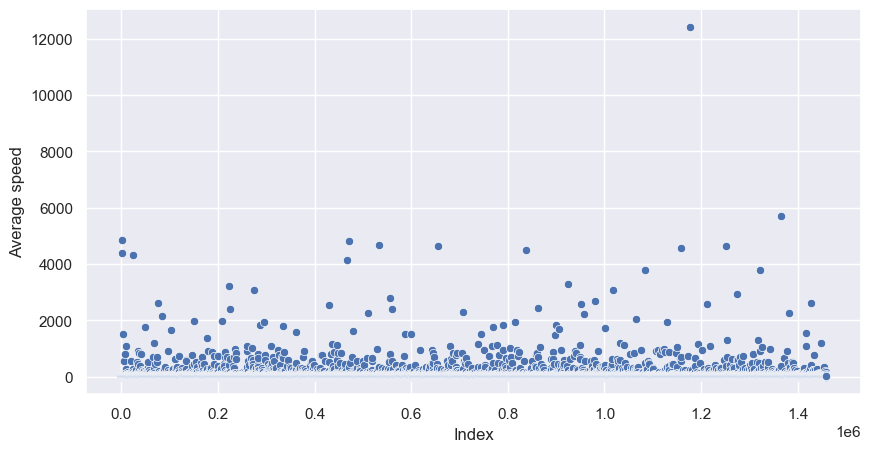

In [222]:
avg_speed = taxi_data['total_distance'] / taxi_data['trip_duration'] * 3.6
fig, ax = plt.subplots(figsize=(10, 5))
sns.scatterplot(x=avg_speed.index, y=avg_speed, ax=ax)
ax.set_xlabel('Index')
ax.set_ylabel('Average speed');

Как раз отсюда мы видим, что у нас есть “поездки-телепортации”, для которых средняя скорость более 1000 км/ч. Даже есть такая, средняя скорость которой составляла более 12000 км/ч! 

Давайте условимся, что предельная средняя скорость, которую могут развивать таксисты будет 300 км/ч. 


Найдем поездки, длительность которых превышает 24 часа и удалим их из набора данных.

Найдем поездки, средняя скорость которых по кратчайшему пути превышает 300 км/ч и удалим их из данных. 

In [223]:
mask_duration = taxi_data['trip_duration'] > 24*60*60
outliers_duration = taxi_data[mask_duration]
taxi_data.drop(outliers_duration.index, inplace=True)
print(f'выбросов по признаку длительности поездки {outliers_duration.shape[0]}')
mask_avgspd = taxi_data['total_distance'] / taxi_data['trip_duration'] * 3.6 > 300
outliers_avgspd = taxi_data[mask_avgspd]
taxi_data.drop(outliers_avgspd.index, inplace=True)
print(f'выбросов по признаку средней скорости поездки {outliers_avgspd.shape[0]}')


выбросов по признаку длительности поездки 4
выбросов по признаку средней скорости поездки 407


## 3. Разведывательный анализ данных (EDA)

В этой части нашего проекта мы:
* Исследуем сформированный набор данных; 
* Попробуем найти закономерности, позволяющие сформулировать предварительные гипотезы относительно того, какие факторы являются решающими в определении длительности поездки;
* Дополним наш анализ визуализациями, иллюстрирующими исследование.


Начинаем с целевого признака. Забегая вперед, скажем, что основной метрикой качества решения поставленной задачи будет RMSLE - Root Mean Squared Log Error, которая вычисляется на основе целевой переменной в логарифмическом масштабе. В таком случае целесообразно сразу логарифмировать признак длительности поездки и рассматривать при анализе логарифм в качестве целевого признака:
$$trip\_duration\_log = log(trip\_duration+1),$$
где под символом log подразумевается натуральный логарифм.


In [224]:
taxi_data['trip_duration_log'] = np.log(taxi_data['trip_duration']+1)

Построим гистограмму и коробчатую диаграмму длительности поездок в логарифмическом масштабе (trip_duration_log). 
Исходя из визуализации, сделайем предположение, является ли полученное распределение нормальным. 
Проверим свою гипотезу с помощью теста **Д’Агостино** при уровне значимости $\alpha=0.05$. 


In [225]:
# ваш код здесь
fig = px.histogram(
    taxi_data,
    x='trip_duration_log',
    nbins=40,
    width=1000,
    height=600,
    title='Распределение прологарифмированной длительности поездки',
    marginal='box',    
)
fig.show(PX_MODE)

In [226]:
# по графику можно предположить, что возможно логарифмированный целевой признак распределен нормально,
# проверим нашу гипотизу:
H0 = 'Данные распределены нормально'
Ha = 'Данные не распределены нормально'
alpha = 0.05
_, p = stats.normaltest(taxi_data['trip_duration_log'])
print(f'p={p:.2f}')

# Интерпретация 
if p > alpha:
	print(H0)
else:
	print(Ha)

p=0.00
Данные не распределены нормально


Построим визуализацию, которая позволит сравнить распределение длительности поездки в логарифмическом масштабе (trip_duration_log) в зависимости от таксопарка (vendor_id). 

Сравним два распределения между собой.

In [227]:
fig = px.histogram(
    taxi_data,
    x='trip_duration_log',
    color='vendor_id',
    nbins=40,
    width=1000,
    height=600,
    title='Распределение прологарифмированной длительности поездки в разрезе таксопарка',
    marginal='box',    
)
fig.show(PX_MODE)


Распределения в группах практически не отличаются, признак vendor_id не имеет значения при определении длительности поездки. Однако выбросов справа гораздо больше у второго таксопарка.

Построим визуализацию, которая позволит сравнить распределение длительности поездки в логарифмическом масштабе (trip_duration_log) в зависимости от признака отправки сообщения поставщику (store_and_fwd_flag). 

Сравним два распределения между собой.

In [228]:
fig = px.histogram(
    taxi_data,
    x='trip_duration_log',
    color='store_and_fwd_flag',
    nbins=40,
    width=1000,
    height=600,
    title='Распределение прологарифмированной длительности поездки в разрезе признака отправки сообщения таксопарку store_and_fwd_flag',
    marginal='box',    
)
fig.show(PX_MODE)


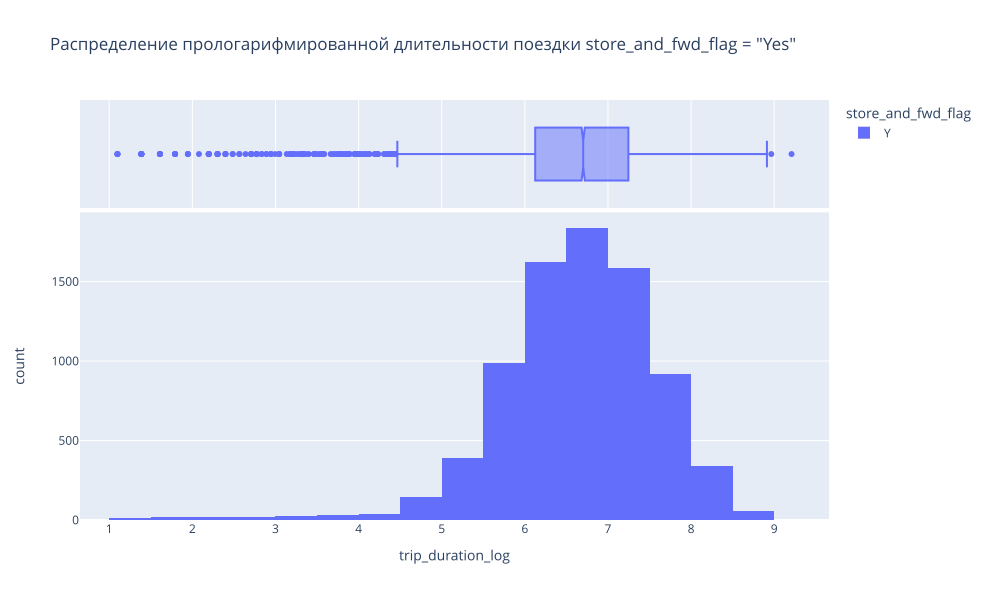

In [229]:
fig = px.histogram(
    taxi_data[taxi_data['store_and_fwd_flag']=='Y'],
    x='trip_duration_log',
    color='store_and_fwd_flag',
    nbins=40,
    width=1000,
    height=600,
    title='Распределение прологарифмированной длительности поездки store_and_fwd_flag = "Yes"',
    marginal='box',    
)
fig.show(PX_MODE)


Распределения в группах значительно отличаются, признак store_and_fwd_flag имеет значение при определении длительности поездки.

Если внимательно присмотреться к распределению длительности поездок в зависимости от признака store_and_fwd_flag, становится ясно, что наиболее длительные поездки принадлежат к группе N (не хранить и не пересылать поездку). Таким образом, флаг сохраняется только для кратковременных поездок, а для аномальных многочасовых — не сохраняется.

Построим две визуализации:
* Распределение количества поездок в зависимости от часа дня;
* Зависимость медианной длительности поездки от часа дня.


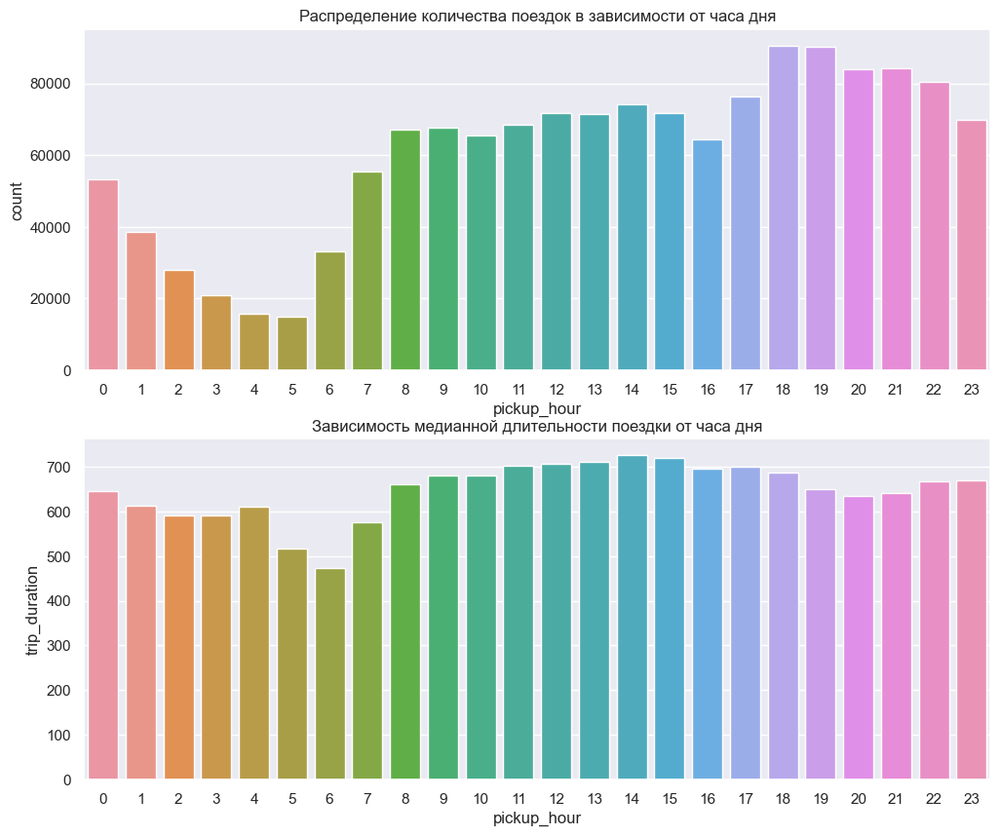

In [230]:
fig, ax = plt.subplots(2,1,figsize=(12, 10))
sns.barplot(
    taxi_data[['pickup_hour']].groupby('pickup_hour', as_index=False).value_counts(),
    x='pickup_hour',
    y='count',
    ax = ax[0]
)
ax[0].set_title("Распределение количества поездок в зависимости от часа дня")
sns.barplot(
    taxi_data[['pickup_hour', 'trip_duration']].groupby('pickup_hour', as_index=False).median(),
    x='pickup_hour',
    y='trip_duration',
    ax = ax[1]
)
ax[1].set_title("Зависимость медианной длительности поездки от часа дня");

На графиках видно, что:
- такси заказывают реже всего с 00:00 по 7:00
- такси заказывают чаще всего с 17:00 по 22:00
- с 11:00 по 18:00 наблюдается пик медианной длительности поездок
- с 01:00 по 07:00 наблюдается наименьшее значение медианной длительности поездок

Построим две визуализации:
* Распределение количества поездок в зависимости от дня недели;
*  Зависимость медианной длительности поездки от дня недели.




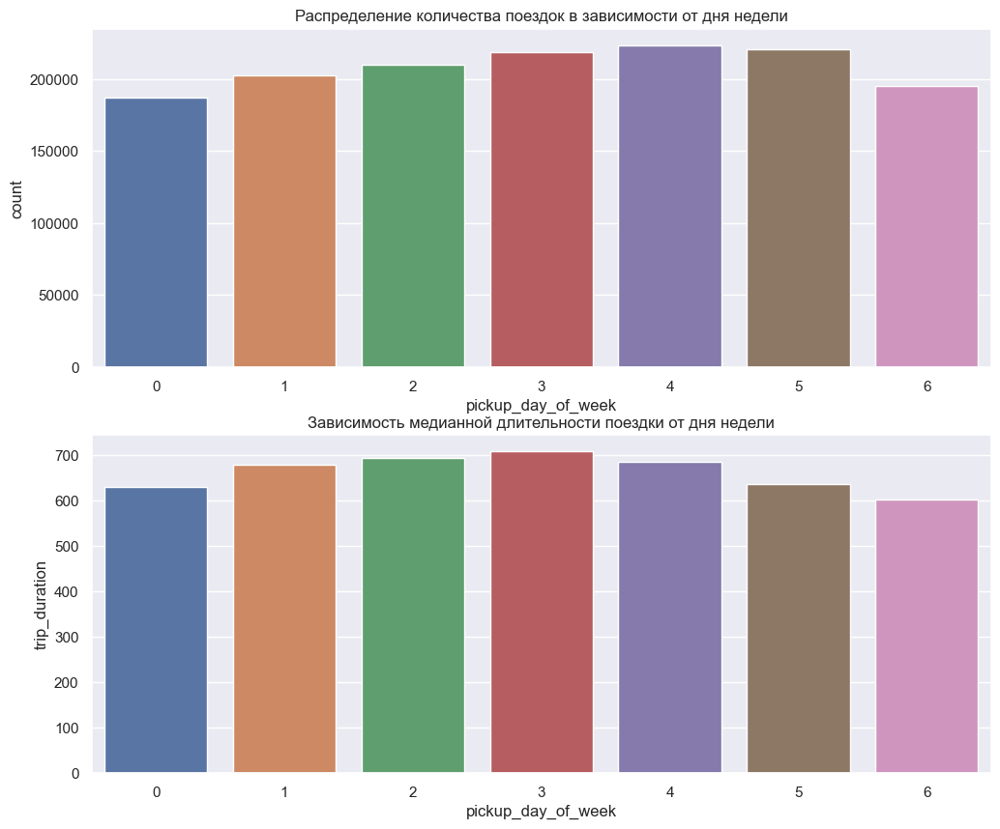

In [231]:
fig, ax = plt.subplots(2,1,figsize=(12, 10))
sns.barplot(
    taxi_data[['pickup_day_of_week']].groupby('pickup_day_of_week', as_index=False).value_counts(),
    x='pickup_day_of_week',
    y='count',
    ax = ax[0]
)
ax[0].set_title("Распределение количества поездок в зависимости от дня недели")
sns.barplot(
    taxi_data[['pickup_day_of_week', 'trip_duration']].groupby('pickup_day_of_week', as_index=False).median(),
    x='pickup_day_of_week',
    y='trip_duration',
    ax = ax[1]
)
ax[1].set_title("Зависимость медианной длительности поездки от дня недели");

- медианная длительность поездок наименьшая в аоскресенье, наибольшая в четверг
- в пятницу совершается больше всего поездок, в понедельник меньше всего

Посмотрим на обе временные характеристики одновременно. 

Построим сводную таблицу, по строкам которой отложены часы (pickup_hour), по столбцам - дни недели (pickup_day_of_week), а в ячейках - медианная длительность поездки (trip_duration). 

Визуализируем полученную сводную таблицу с помощью тепловой карты.

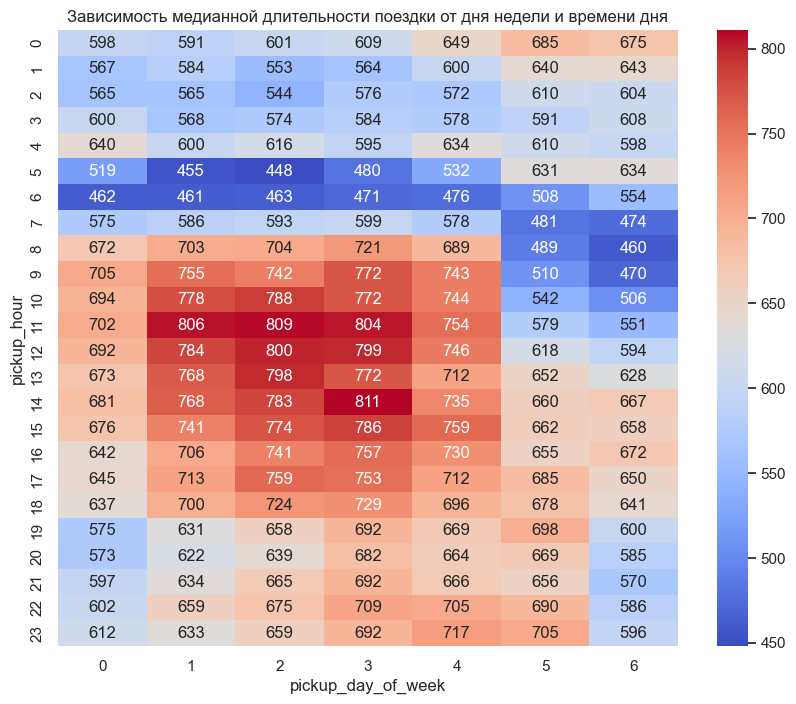

In [232]:
pivot = pd.pivot_table(
    taxi_data,
    index='pickup_hour',
    columns='pickup_day_of_week',
    values='trip_duration',
    aggfunc='median'
    )
fig, axes = plt.subplots(figsize=(10,8))
sns.heatmap(
    data=pivot,
    cmap='coolwarm',
    annot=True,
    fmt=".0f",
    ax=axes
)
axes.set_title('Зависимость медианной длительности поездки от дня недели и времени дня');

Наибольшая медианная длительность поездки наблюдалась в четверг в 14 часов дня.

Самые продолжительные поездки (в медианном смысле) наблюдаются с понедельника по пятницу в промежутке с 8 до 18 часов.

Построим две диаграммы рассеяния (scatter-диаграммы):
* первая будет иллюстрировать географическое расположение точек начала поездок (pickup_longitude, pickup_latitude) 
* вторая будет географическое расположение точек завершения поездок (dropoff_longitude, dropoff_latitude).

Для этого на диаграммах по оси абсцисс отложим широту (longitude), а по оси ординат - долготу (latitude). 
Включим в визуализацию только те точки, которые находятся в пределах Нью-Йорка - добавим следующие ограничения на границы осей абсцисс и ординат:
 
city_long_border = (-74.03, -73.75)

city_lat_border = (40.63, 40.85)

Добавим на диаграммы расцветку по десяти географическим кластерам (geo_cluster), которые мы сгенерировали ранее. 

c:\Users\maxim\.conda\envs\pd_np\lib\site-packages\IPython\core\events.py:89: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

c:\Users\maxim\.conda\envs\pd_np\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



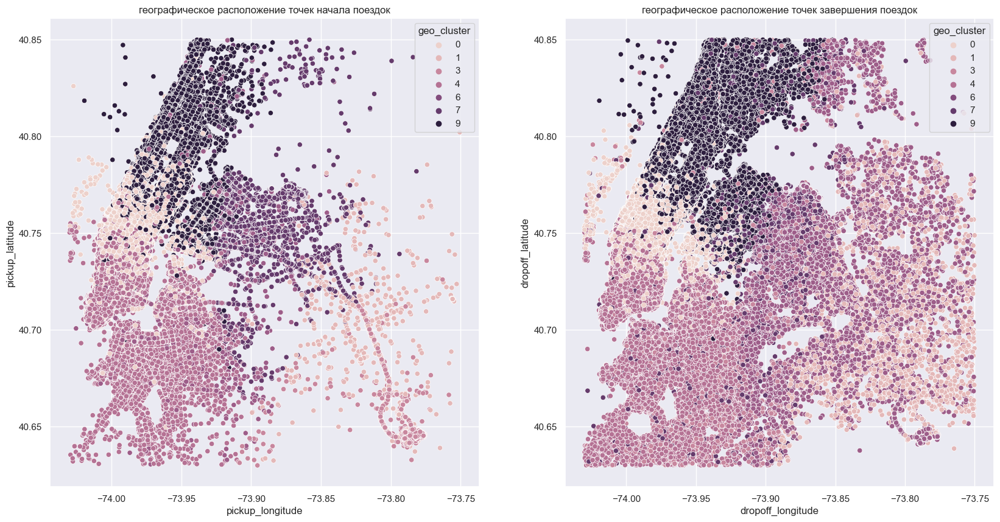

In [233]:
city_long_border = (-74.03, -73.75)
city_lat_border = (40.63, 40.85)
mask1 = taxi_data['dropoff_longitude'].between(*city_long_border) & taxi_data['pickup_longitude'].between(*city_long_border)
mask2 = taxi_data['dropoff_latitude'].between(*city_lat_border) & taxi_data['pickup_latitude'].between(*city_lat_border)

fig, ax = plt.subplots(1,2,figsize=(20, 10))
sns.scatterplot(
    taxi_data[mask1&mask2],
    x='pickup_longitude',
    y='pickup_latitude',
    hue='geo_cluster',
    ax = ax[0]
)
ax[0].set_title("географическое расположение точек начала поездок")
sns.scatterplot(
    taxi_data[mask1&mask2],
    x='dropoff_longitude',
    y='dropoff_latitude',
    hue='geo_cluster',
    ax = ax[1]
)
ax[1].set_title("географическое расположение точек завершения поездок");


Сравним с картой:

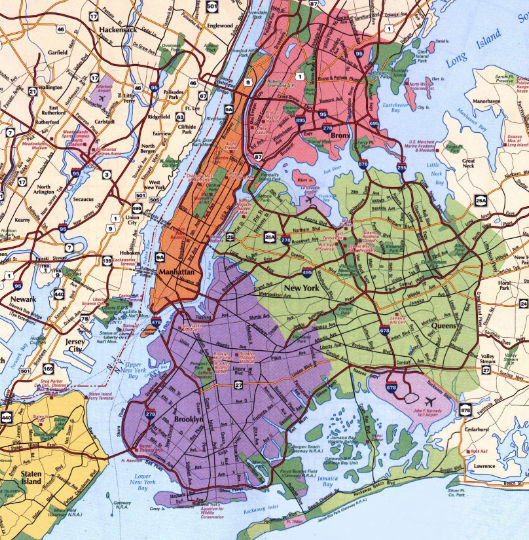

Видна взаимосвязь деления на кластеры, и районов \ микрорайонов города.

 Так же видим, что начало поездок сконцентрировано в одних и тех же точках, ближе к центру города, а вот точки окончания распределены более равномерно.

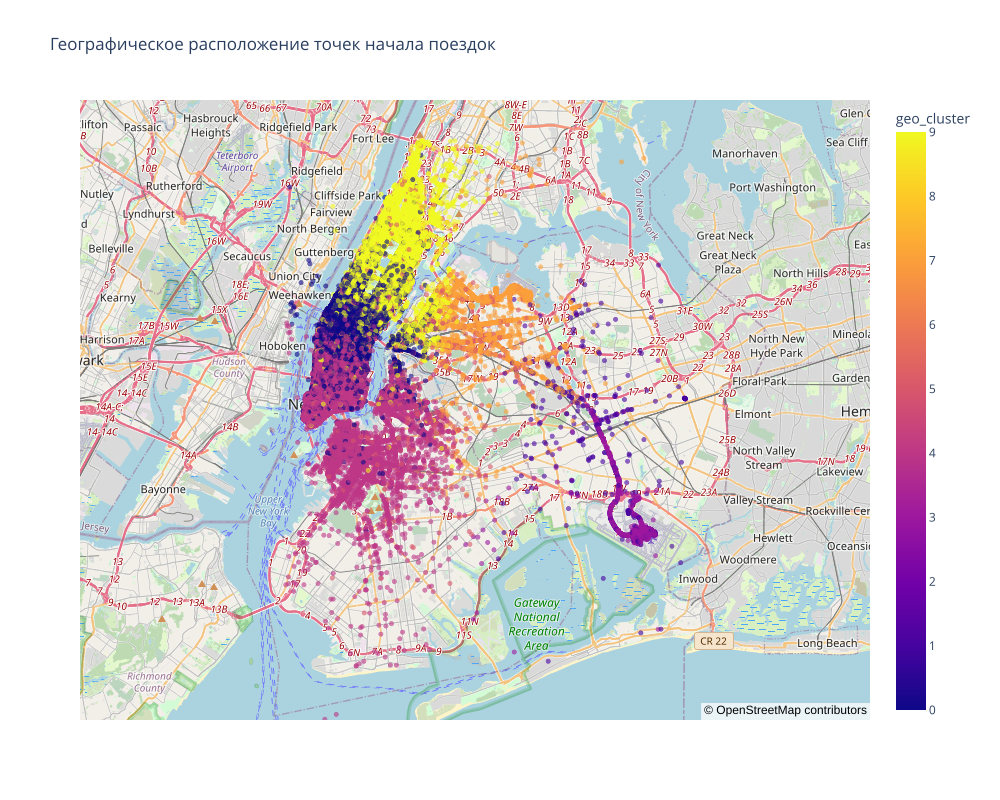

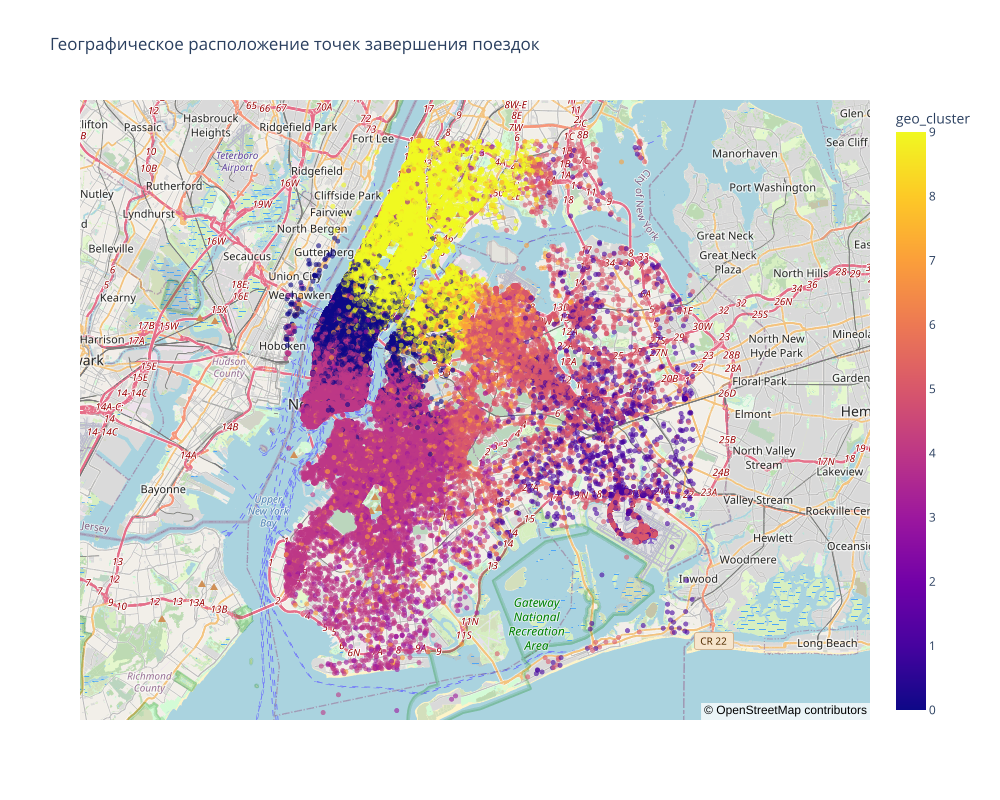

In [ ]:
# А теперь расширим границы города и построи точки на карте
# возьмем каждую n-ную точку в нашей выборке, да при таком подходе распределение может быть нарушено, 
# но так как у нас более 1.5млн объектов это допустимо и позволит нам сильно сокраить время постоение карты
city_long_border = (-74.03, -73.75)
city_lat_border = (40.53, 40.85)
mask1 = taxi_data['dropoff_longitude'].between(*city_long_border) & taxi_data['pickup_longitude'].between(*city_long_border)
mask2 = taxi_data['dropoff_latitude'].between(*city_lat_border) & taxi_data['pickup_latitude'].between(*city_lat_border)
fig = px.scatter_mapbox(
                        taxi_data[mask1&mask2][::3],
                        lon='pickup_longitude',
                        lat='pickup_latitude',
                        color='geo_cluster', 
                        zoom=10,
                        height=800,
                        width=1000,
                        center={'lat':40.71,'lon':-73.9},
                        opacity=0.6,
                        title="Географическое расположение точек начала поездок"
                        )


fig.update_layout(mapbox_style="open-street-map",
                  showlegend = False)


fig.show(PX_MODE)

fig = px.scatter_mapbox(
                        taxi_data[mask1&mask2][::3],
                        lon='dropoff_longitude',
                        lat='dropoff_latitude',
                        color='geo_cluster', 
                        zoom=10,
                        height=800,
                        width=1000,
                        center={'lat':40.71,'lon':-73.9},
                        opacity=0.6,
                        title="Географическое расположение точек завершения поездок"
                        )


fig.update_layout(mapbox_style="open-street-map",
                  showlegend = False)


fig.show(PX_MODE)

## 4. Отбор и преобразование признаков

Перед тем как перейти к построению модели, осталось сделать ещё несколько шагов.
* Следует помнить, что многие алгоритмы машинного обучения не могут обрабатывать категориальные признаки в их обычном виде. Поэтому нам необходимо их закодировать;
* Надо отобрать признаки, которые мы будем использовать для обучения модели;
*  Необходимо масштабировать и трансформировать некоторые признаки для того, чтобы улучшить сходимость моделей, в основе которых лежат численные методы.


In [235]:
print('Shape of data: {}'.format(taxi_data.shape))
print('Columns: {}'.format(taxi_data.columns))

Shape of data: (1458233, 27)
Columns: Index(['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime',
       'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration', 'pickup_date', 'pickup_hour', 'pickup_day_of_week',
       'pickup_holiday', 'total_distance', 'total_travel_time',
       'number_of_steps', 'haversine_distance', 'direction', 'geo_cluster',
       'temperature', 'visibility', 'wind speed', 'precip', 'events',
       'trip_duration_log'],
      dtype='object')


Для удобства работы сделаем копию исходной таблицы с поездками:

In [236]:
train_data = taxi_data.copy()
train_data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,number_of_steps,haversine_distance,direction,geo_cluster,temperature,visibility,wind speed,precip,events,trip_duration_log
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,...,5.0,1.498521,99.970196,9,4.4,8.0,27.8,0.3,None,6.122493
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,...,6.0,1.805507,-117.153768,4,28.9,16.1,7.4,0.0,None,6.498282
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,...,16.0,6.385098,-159.680165,4,-6.7,16.1,24.1,0.0,None,7.661527
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,...,4.0,1.485498,-172.737700,4,7.2,16.1,25.9,0.0,None,6.063785
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,...,5.0,1.188588,179.473585,9,9.4,16.1,9.3,0.0,None,6.077642


Сразу позаботимся об очевидных неинформативных и избыточных признаках. 

id является уникальным для каждой поездки и не несет полезной информации в определении ее продолжительности

Наличие признака dropoff_datetime в обучающем наборе данных создает утечку данных



In [237]:
train_data = train_data.drop(['id', 'dropoff_datetime'], axis=1)
train_data.shape

(1458233, 25)

Ранее мы извлекли всю необходимую для нас информацию из даты начала поездки, теперь мы можем избавиться от этих признаков, так как они нам больше не понадобятся:


In [238]:
drop_columns = ['pickup_datetime', 'pickup_date']
train_data = train_data.drop(drop_columns, axis=1)
print('Shape of data:  {}'.format(train_data.shape))

Shape of data:  (1458233, 23)


Теперь займёмся кодированием категориальных признаков. В наших данных к категориальным можно отнести следующие признаки:

- vendor_id;
- store_and_fwd_flag;
- pickup_day_of_week;
- geo_cluster;
- events

### Задание 4.2.

Закодируем признак vendor_id в таблице train_data таким образом, чтобы он был равен 0, если идентификатор таксопарка равен 1, и 1 — в противном случае.

Закодируем признак store_and_fwd_flag в таблице train_data таким образом, чтобы он был равен 0, если флаг выставлен в значение 'N', и 1 — в противном случае.



In [239]:
train_data['vendor_id'] = train_data['vendor_id'].apply(lambda x: 0 if x==1 else 1)
train_data['store_and_fwd_flag'] = train_data['store_and_fwd_flag'].apply(lambda x: 0 if x=='N' else 1)
print(f'Среднее по закодированному "vendor id" {train_data["vendor_id"].mean():.2f}, Среднее по закодировваному "store_and_fwd_flag" {train_data["store_and_fwd_flag"].mean():.3f}')

Среднее по закодированному "vendor id" 0.53, Среднее по закодировваному "store_and_fwd_flag" 0.006


Создадим таблицу data_onehot из закодированных однократным кодированием признаков pickup_day_of_week, geo_cluster и events в таблице train_data с помощью OneHotEncoder из библиотеки sklearn. Параметр drop выставим в значение 'first', чтобы удалять первый бинарный столбец, тем самым не создавая излишних признаков.


In [240]:
columns_to_change = ['pickup_day_of_week', 'geo_cluster', 'events']
one_hot_encoder = OneHotEncoder(drop='first')
data_onehot = one_hot_encoder.fit_transform(train_data[columns_to_change]).toarray()
columns_names = one_hot_encoder.get_feature_names_out()
data_onehot = pd.DataFrame(data_onehot, columns=columns_names)

In [241]:
print(f'{len(columns_names)} бинарных столбцов получилось сгенерировать с помощью однократного кодирования')

18 бинарных столбцов получилось сгенерировать с помощью однократного кодирования


Добавим полученную таблицу с закодированными признаками:

In [242]:
train_data = pd.concat(
    [train_data.reset_index(drop=True).drop(columns_to_change, axis=1), data_onehot], 
    axis=1
)
print('Shape of data: {}'.format(train_data.shape))

Shape of data: (1458233, 38)


In [243]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458233 entries, 0 to 1458232
Data columns (total 38 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   vendor_id             1458233 non-null  int64  
 1   passenger_count       1458233 non-null  int64  
 2   pickup_longitude      1458233 non-null  float64
 3   pickup_latitude       1458233 non-null  float64
 4   dropoff_longitude     1458233 non-null  float64
 5   dropoff_latitude      1458233 non-null  float64
 6   store_and_fwd_flag    1458233 non-null  int64  
 7   trip_duration         1458233 non-null  int64  
 8   pickup_hour           1458233 non-null  int32  
 9   pickup_holiday        1458233 non-null  float64
 10  total_distance        1458233 non-null  float64
 11  total_travel_time     1458233 non-null  float64
 12  number_of_steps       1458233 non-null  float64
 13  haversine_distance    1458233 non-null  float64
 14  direction             1458233 non-

Теперь, когда категориальные признаки предобработаны, сформируем матрицу наблюдений X, вектор целевой переменной y и его логарифм y_log. В матрицу наблюдений войдут все столбцы из таблицы с поездками за исключением целевого признака trip_duration и его логарифмированной версии trip_duration_log:


In [244]:
X = train_data.drop(['trip_duration', 'trip_duration_log'], axis=1)
y = train_data['trip_duration']
y_log = train_data['trip_duration_log']

Все наши модели мы будем обучать на логарифмированной версии y_log. 

 Так как наш набор данных довольно большой (почти 1.5 миллиона наблюдений), то мы свободно можем использовать hold-out-валидацию. Использование k-fold-валидации и тем более leave-one-out-валидации при таком объёме данных будет избыточным и времязатратным. Разобьем выборку на обучающую и валидационную в соотношении 67/33:

In [245]:
X_train, X_valid, y_train_log, y_valid_log = model_selection.train_test_split(
    X, y_log, 
    test_size=0.33, 
    random_state=42
)

На данный момент у нас достаточно много признаков: скорее всего, не все из них будут важны. Давайте оставим лишь те, которые сильнее всего связаны с целевой переменной и точно будут вносить вклад в повышение качества модели.


С помощью SelectKBest отберем 25 признаков, наилучшим образом подходящих для предсказания целевой переменной в логарифмическом масштабе. Отбор реализуем по обучающей выборке, используя параметр score_func = f_regression.


In [246]:
selector = SelectKBest(f_regression, k=25)
selector.fit(X_train, y_train_log)
best_features = selector.get_feature_names_out()
print('Список наиболее важных признаков: \n', best_features)
X_train, X_valid = X_train[best_features], X_valid[best_features]

Список наиболее важных признаков: 
 ['vendor_id' 'passenger_count' 'pickup_longitude' 'pickup_latitude'
 'dropoff_longitude' 'dropoff_latitude' 'store_and_fwd_flag' 'pickup_hour'
 'pickup_holiday' 'total_distance' 'total_travel_time' 'number_of_steps'
 'haversine_distance' 'temperature' 'pickup_day_of_week_1'
 'pickup_day_of_week_2' 'pickup_day_of_week_3' 'pickup_day_of_week_4'
 'pickup_day_of_week_5' 'pickup_day_of_week_6' 'geo_cluster_1'
 'geo_cluster_3' 'geo_cluster_5' 'geo_cluster_7' 'geo_cluster_9']


Так как мы будем использовать различные модели, в том числе внутри которых заложены численные методы оптимизации, то давайте заранее позаботимся о масштабировании факторов. 


Нормализуем предикторы в обучающей и валидационной выборках с помощью MinMaxScaler из библиотеки sklearn. 



In [247]:
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_valid_scaled = scaler.transform(X_valid)

In [249]:
# Создадим сводную таблицу результатов для метрик обученных моделей
results = pd.DataFrame(columns = ['RMSLE на тренировочной выборке',
                                  'RMSLE на валидационной выборке',
                                  'R2 на тренировочной выборке',
                                  'R2 на валидационной выборке'],
                       index = ['linear',
                                'polynom^2',
                                'l2-regular. polynom^2',
                                'DecisionTree',
                                'RandomForest',
                                'GradBoost',
                                'XGBOOST',
                                'LGBM'])
results

,RMSLE на тренировочной выборке,RMSLE на валидационной выборке,R2 на тренировочной выборке,R2 на валидационной выборке
linear,NaN,NaN,NaN,NaN
polynom^2,NaN,NaN,NaN,NaN
l2-regular. polynom^2,NaN,NaN,NaN,NaN
DecisionTree,NaN,NaN,NaN,NaN
RandomForest,NaN,NaN,NaN,NaN
GradBoost,NaN,NaN,NaN,NaN
XGBOOST,NaN,NaN,NaN,NaN
LGBM,NaN,NaN,NaN,NaN


## 5. Решение задачи регрессии: линейная регрессия и деревья решений

Определим метрику, по которой мы будем измерять качество наших моделей. Мы будем следовать канонам исходного соревнования на Kaggle и в качестве метрики использовать RMSLE (Root Mean Squared Log Error), которая вычисляется как:
$$RMSLE = \sqrt{\frac{1}{n}\sum_{i=1}^n(log(y_i+1)-log(\hat{y_i}+1))^2},$$
где:
* $y_i$ - истинная длительность i-ой поездки на такси (trip_duration)
* $\hat{y_i}$- предсказанная моделью длительность i-ой поездки на такси

Заметим, что логарифмирование целевого признака мы уже провели заранее, поэтому нам будет достаточно вычислить метрику RMSE для модели, обученной прогнозировать длительность поездки такси в логарифмическом масштабе:
$$z_i=log(y_i+1),$$
$$RMSLE = \sqrt{\frac{1}{n}\sum_{i=1}^n(z_i-\hat{z_i})^2}=\sqrt{MSE(z_i,\hat{z_i})}$$ 



Построим модель линейной регрессии на обучающей выборке 


In [250]:
model = LinearRegression()
model.fit(X_train_scaled,y_train_log)
y_train_log_pred = model.predict(X_train_scaled)
y_valid_log_pred = model.predict(X_valid_scaled)
print(f'RMSLE на тренировочной выборке = {np.sqrt(mean_squared_error(y_train_log, y_train_log_pred)):.2f}')
print(f'RMSLE на валидационной выборке = {np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred)):.2f}')

print(f'R2 на тренировочной выборке = {r2_score(y_train_log, y_train_log_pred):.2f}')
print(f'R2 на валидационной выборке = {r2_score(y_valid_log, y_valid_log_pred):.2f}')

results.loc['linear',:] = np.sqrt(mean_squared_error(y_train_log, y_train_log_pred)), np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred)), r2_score(y_train_log, y_train_log_pred), r2_score(y_valid_log, y_valid_log_pred)
results


RMSLE на тренировочной выборке = 0.54
RMSLE на валидационной выборке = 0.54
R2 на тренировочной выборке = 0.54
R2 на валидационной выборке = 0.54


,RMSLE на тренировочной выборке,RMSLE на валидационной выборке,R2 на тренировочной выборке,R2 на валидационной выборке
linear,0.535644,0.538098,0.542402,0.540438
polynom^2,NaN,NaN,NaN,NaN
l2-regular. polynom^2,NaN,NaN,NaN,NaN
DecisionTree,NaN,NaN,NaN,NaN
RandomForest,NaN,NaN,NaN,NaN
GradBoost,NaN,NaN,NaN,NaN
XGBOOST,NaN,NaN,NaN,NaN
LGBM,NaN,NaN,NaN,NaN


Сгенерируем полиномиальные признаки 2-ой степени с помощью PolynomialFeatures из библиотеки sklearn. 

Построим модель полиномиальной регрессии 2-ой степени на обучающей выборке 


In [251]:
poly = PolynomialFeatures(degree = 2, include_bias = False)
X_train_scaled_poly = poly.fit_transform(X_train_scaled)
X_valid_scaled_poly = poly.transform(X_valid_scaled)

model = LinearRegression()
model.fit(X_train_scaled_poly,y_train_log)
y_train_log_poly_pred = model.predict(X_train_scaled_poly)
y_valid_log_poly_pred = model.predict(X_valid_scaled_poly)

print(f'RMSLE на тренировочной выборке = {np.sqrt(mean_squared_error(y_train_log, y_train_log_poly_pred)):.2f}')
print(f'RMSLE на валидационной выборке = {np.sqrt(mean_squared_error(y_valid_log, y_valid_log_poly_pred)):.2f}')

print(f'R2 на тренировочной выборке = {r2_score(y_train_log, y_train_log_poly_pred):.2f}')
print(f'R2 на валидационной выборке = {r2_score(y_valid_log, y_valid_log_poly_pred):.2f}')

results.loc['polynom^2',:] = np.sqrt(mean_squared_error(y_train_log, y_train_log_poly_pred)), np.sqrt(mean_squared_error(y_valid_log, y_valid_log_poly_pred)), r2_score(y_train_log, y_train_log_poly_pred), r2_score(y_valid_log, y_valid_log_poly_pred)
results



RMSLE на тренировочной выборке = 0.47
RMSLE на валидационной выборке = 0.70
R2 на тренировочной выборке = 0.65
R2 на валидационной выборке = 0.22


,RMSLE на тренировочной выборке,RMSLE на валидационной выборке,R2 на тренировочной выборке,R2 на валидационной выборке
linear,0.535644,0.538098,0.542402,0.540438
polynom^2,0.466375,0.700346,0.653102,0.221522
l2-regular. polynom^2,NaN,NaN,NaN,NaN
DecisionTree,NaN,NaN,NaN,NaN
RandomForest,NaN,NaN,NaN,NaN
GradBoost,NaN,NaN,NaN,NaN
XGBOOST,NaN,NaN,NaN,NaN
LGBM,NaN,NaN,NaN,NaN


У модели наблюдаем переобучение.


Построим модель полиномиальной регрессии 2-ой степени с L2-регуляризацией (регуляризация по Тихонову)  Коэффициент регуляризации $\alpha$ установим 1


In [ ]:

model = Ridge(alpha=1)
model.fit(X_train_scaled_poly,y_train_log)
y_train_log_poly_pred_l2 = model.predict(X_train_scaled_poly)
y_valid_log_poly_pred_l2 = model.predict(X_valid_scaled_poly)

print(f'RMSLE на тренировочной выборке = {np.sqrt(mean_squared_error(y_train_log, y_train_log_poly_pred_l2)):.2f}')
print(f'RMSLE на валидационной выборке = {np.sqrt(mean_squared_error(y_valid_log, y_valid_log_poly_pred_l2)):.2f}')

print(f'R2 на тренировочной выборке = {r2_score(y_train_log, y_train_log_poly_pred_l2):.2f}')
print(f'R2 на валидационной выборке = {r2_score(y_valid_log, y_valid_log_poly_pred_l2):.2f}')

RMSLE на тренировочной выборке = 0.48
RMSLE на валидационной выборке = 0.48
R2 на тренировочной выборке = 0.64
R2 на валидационной выборке = 0.63


Проблемы переобучения не наблюдаются, результат лучше базовой модели ленейной регрессии на полиноме 2 степени.

Попробуем улучшить именив alpha.

минимальное значение ошибки на valid при глубине: 0.0048


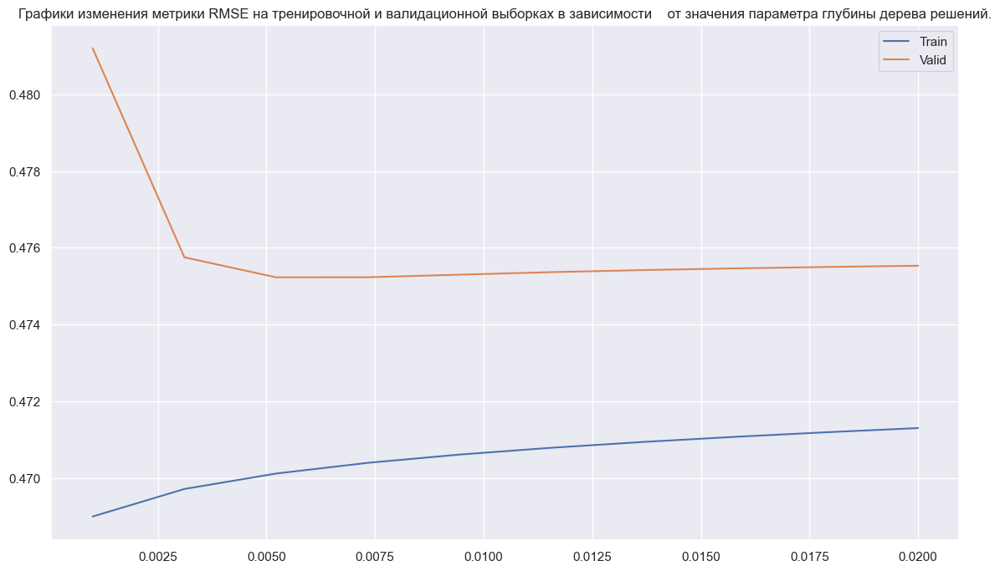

In [253]:
train_rmse = []
valid_rmse = []
alpha_range = np.linspace(0.001,0.02,10)

for i in alpha_range:
    model = model = Ridge(alpha=i)
    model.fit(X_train_scaled_poly,y_train_log)
    y_train_log_pred_l2 = model.predict(X_train_scaled_poly)
    y_valid_log_pred_l2 = model.predict(X_valid_scaled_poly)
    train_rmse.append(np.sqrt(mean_squared_error(y_train_log, y_train_log_pred_l2)))
    valid_rmse.append(np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred_l2)))

fig, ax = plt.subplots(figsize=(14,8))
sns.lineplot(x = alpha_range, y = train_rmse, ax=ax, label = 'Train')
sns.lineplot(x = alpha_range, y = valid_rmse, ax=ax, label = 'Valid')
ax.set_title("Графики изменения метрики RMSE на тренировочной и валидационной выборках в зависимости\
    от значения параметра глубины дерева решений.")
ax.legend();

print(f'минимальное значение ошибки на valid при глубине: {np.array(valid_rmse).argmin()*0.0019+0.001:.4f}')

In [254]:
print(f'Смогли уменишить метрику RMSE до {np.array(valid_rmse).min():.3f}')
results.loc['l2-regular. polynom^2',:] = np.sqrt(mean_squared_error(y_train_log, y_train_log_pred_l2)), np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred_l2)), r2_score(y_train_log, y_train_log_pred_l2), r2_score(y_valid_log, y_valid_log_pred_l2)
results

Смогли уменишить метрику RMSE до 0.475


,RMSLE на тренировочной выборке,RMSLE на валидационной выборке,R2 на тренировочной выборке,R2 на валидационной выборке
linear,0.535644,0.538098,0.542402,0.540438
polynom^2,0.466375,0.700346,0.653102,0.221522
l2-regular. polynom^2,0.471302,0.475533,0.645734,0.641092
DecisionTree,NaN,NaN,NaN,NaN
RandomForest,NaN,NaN,NaN,NaN
GradBoost,NaN,NaN,NaN,NaN
XGBOOST,NaN,NaN,NaN,NaN
LGBM,NaN,NaN,NaN,NaN


Построим модель дерева решений (DecisionTreeRegressor) 

In [255]:
model = DecisionTreeRegressor(random_state = RANDOM_STATE)
model.fit(X_train_scaled,y_train_log)
y_train_log_pred_dt = model.predict(X_train_scaled)
y_valid_log_pred_dt = model.predict(X_valid_scaled)
print(f'RMSLE на тренировочной выборке = {np.sqrt(mean_squared_error(y_train_log, y_train_log_pred_dt)):.2f}')
print(f'RMSLE на валидационной выборке = {np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred_dt)):.2f}')

print(f'R2 на тренировочной выборке = {r2_score(y_train_log, y_train_log_pred_dt):.2f}')
print(f'R2 на валидационной выборке = {r2_score(y_valid_log, y_valid_log_pred_dt):.2f}')




RMSLE на тренировочной выборке = 0.00
RMSLE на валидационной выборке = 0.57
R2 на тренировочной выборке = 1.00
R2 на валидационной выборке = 0.49


Глубину дерева не ограничили - у модели наблюдаем переобучение.

Переберем все возможные варианты глубины дерева решений в диапазоне от 7 до 20:

max_depths = range(7, 20)




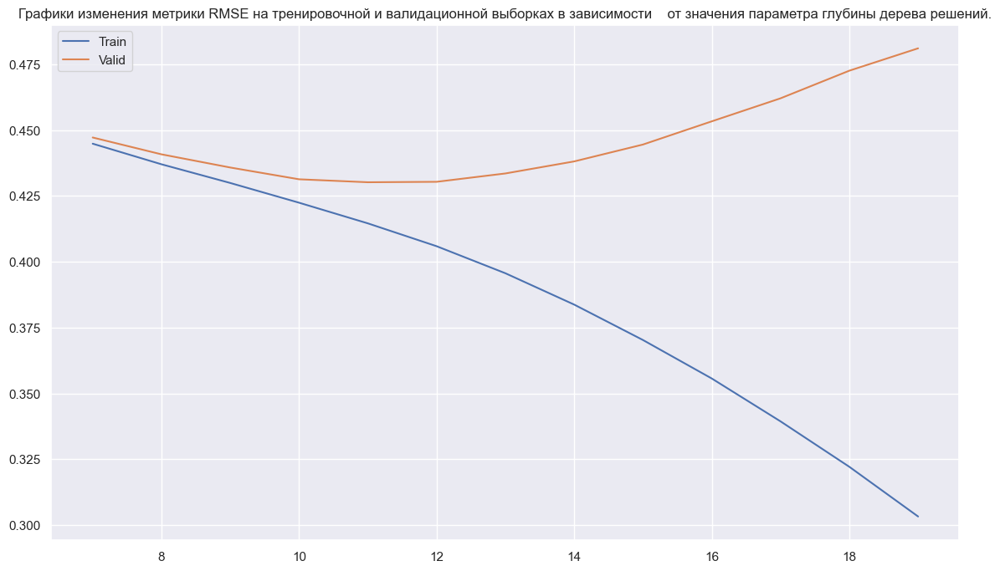

In [256]:
train_rmse = []
valid_rmse = []
depth_range = range(7,20)

for i in depth_range:
    model = DecisionTreeRegressor(max_depth=i, random_state = RANDOM_STATE)
    model.fit(X_train_scaled,y_train_log)
    y_train_log_pred_dt2 = model.predict(X_train_scaled)
    y_valid_log_pred_dt2 = model.predict(X_valid_scaled)
    train_rmse.append(np.sqrt(mean_squared_error(y_train_log, y_train_log_pred_dt2)))
    valid_rmse.append(np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred_dt2)))

fig, ax = plt.subplots(figsize=(14,8))
sns.lineplot(x = depth_range, y = train_rmse, ax=ax, label = 'Train')
sns.lineplot(x = depth_range, y = valid_rmse, ax=ax, label = 'Valid')
ax.set_title("Графики изменения метрики RMSE на тренировочной и валидационной выборках в зависимости\
    от значения параметра глубины дерева решений.")
ax.legend();


In [257]:
print(f'минимальное значение ошибки на valid при глубине: {np.array(valid_rmse).argmin()+7}')

минимальное значение ошибки на valid при глубине: 11


Однако, ошибка на валидационной выборке при 12 примерно равна, но при 12 меньше ошибка на трейне, выбирем 12.


In [258]:
model = DecisionTreeRegressor(max_depth=12, random_state = RANDOM_STATE)
model.fit(X_train_scaled,y_train_log)
y_train_log_pred_dt2 = model.predict(X_train_scaled)
y_valid_log_pred_dt2 = model.predict(X_valid_scaled)
print(f'RMSLE на тренировочной выборке = {np.sqrt(mean_squared_error(y_train_log, y_train_log_pred_dt2)):.2f}')
print(f'RMSLE на валидационной выборке = {np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred_dt2)):.2f}')

print(f'R2 на тренировочной выборке = {r2_score(y_train_log, y_train_log_pred_dt2):.2f}')
print(f'R2 на валидационной выборке = {r2_score(y_valid_log, y_valid_log_pred_dt2):.2f}')\
    
results.loc['DecisionTree',:] = np.sqrt(mean_squared_error(y_train_log, y_train_log_pred_dt2)), np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred_dt2)), r2_score(y_train_log, y_train_log_pred_dt2), r2_score(y_valid_log, y_valid_log_pred_dt2)
results

RMSLE на тренировочной выборке = 0.41
RMSLE на валидационной выборке = 0.43
R2 на тренировочной выборке = 0.74
R2 на валидационной выборке = 0.71


,RMSLE на тренировочной выборке,RMSLE на валидационной выборке,R2 на тренировочной выборке,R2 на валидационной выборке
linear,0.535644,0.538098,0.542402,0.540438
polynom^2,0.466375,0.700346,0.653102,0.221522
l2-regular. polynom^2,0.471302,0.475533,0.645734,0.641092
DecisionTree,0.405894,0.430348,0.737241,0.706059
RandomForest,NaN,NaN,NaN,NaN
GradBoost,NaN,NaN,NaN,NaN
XGBOOST,NaN,NaN,NaN,NaN
LGBM,NaN,NaN,NaN,NaN


Проблема переобучения решена, а также мы получили 10 процентное улучшение метрики по сравнению с L2 моделью.

## 6. Решение задачи регрессии: ансамблевые методы и построение прогноза

Переходим к тяжелой артиллерии: ансамблевым алгоритмам. 

Построим модель случайного леса 
* n_estimators=200,
* max_depth=12,
* criterion='squared_error',
* min_samples_split=20,
* random_state=42


In [259]:
model = RandomForestRegressor(n_estimators=200,
                              max_depth=12,
                              criterion='squared_error',
                              min_samples_split=20,
                              random_state=RANDOM_STATE,
                              verbose=2,
                              n_jobs=-1)
model.fit(X_train_scaled,y_train_log)
y_train_log_pred_RF = model.predict(X_train_scaled)
y_valid_log_pred_RF = model.predict(X_valid_scaled)
print(f'RMSLE на тренировочной выборке = {np.sqrt(mean_squared_error(y_train_log, y_train_log_pred_RF)):.2f}')
print(f'RMSLE на валидационной выборке = {np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred_RF)):.2f}')

print(f'R2 на тренировочной выборке = {r2_score(y_train_log, y_train_log_pred_RF):.2f}')
print(f'R2 на валидационной выборке = {r2_score(y_valid_log, y_valid_log_pred_RF):.2f}')

results.loc['RandomForest',:] = np.sqrt(mean_squared_error(y_train_log, y_train_log_pred_RF)), np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred_RF)), r2_score(y_train_log, y_train_log_pred_RF), r2_score(y_valid_log, y_valid_log_pred_RF)
results

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 20 concurrent workers.


building tree 1 of 200
building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200


[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    9.2s


building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200
building tree 44 of 200
building tree 45 of 200
building tree 46 of 200
building tree 47 of 200
building tree 48 of 200
building tree 49 of 200
building tree 50 of 200
building tree 51 of 200
building tree 52 of 200
building tree 53 of 200
building tree 54 of 200
building tree 55 of 200
building tree 56 of 200
building tree 57 of 200
building tree 58 of 200
building tree 59 of 200
building tree 60 of 200
building tree 61 of 200
building tree 62 of 200
building tree 63 of 200
building tree 64 of 200
building tree 65 of 200
building tree 66 of 200
building tree 67 of 200
building tree 68 of 200
building tree 69 of 200
building tree 70 of 200
building tree 71 of 200
building tree 72 of 200
building tree 73

[Parallel(n_jobs=-1)]: Done 122 tasks      | elapsed:  1.1min


building tree 143 of 200
building tree 144 of 200
building tree 145 of 200
building tree 146 of 200
building tree 147 of 200
building tree 148 of 200
building tree 149 of 200
building tree 150 of 200
building tree 151 of 200
building tree 152 of 200
building tree 153 of 200
building tree 154 of 200
building tree 155 of 200
building tree 156 of 200
building tree 157 of 200
building tree 158 of 200
building tree 159 of 200
building tree 160 of 200
building tree 161 of 200
building tree 162 of 200
building tree 163 of 200
building tree 164 of 200
building tree 165 of 200
building tree 166 of 200
building tree 167 of 200
building tree 168 of 200
building tree 169 of 200
building tree 170 of 200
building tree 171 of 200
building tree 172 of 200
building tree 173 of 200
building tree 174 of 200
building tree 175 of 200
building tree 176 of 200
building tree 177 of 200
building tree 178 of 200
building tree 179 of 200
building tree 180 of 200
building tree 181 of 200
building tree 182 of 200


[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  1.6min finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 122 tasks      | elapsed:    0.7s
[Parallel(n_jobs=20)]: Done 200 out of 200 | elapsed:    1.1s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 122 tasks      | elapsed:    0.3s
[Parallel(n_jobs=20)]: Done 200 out of 200 | elapsed:    0.5s finished


RMSLE на тренировочной выборке = 0.40
RMSLE на валидационной выборке = 0.41
R2 на тренировочной выборке = 0.75
R2 на валидационной выборке = 0.73


,RMSLE на тренировочной выборке,RMSLE на валидационной выборке,R2 на тренировочной выборке,R2 на валидационной выборке
linear,0.535644,0.538098,0.542402,0.540438
polynom^2,0.466375,0.700346,0.653102,0.221522
l2-regular. polynom^2,0.471302,0.475533,0.645734,0.641092
DecisionTree,0.405894,0.430348,0.737241,0.706059
RandomForest,0.399149,0.414041,0.745902,0.727913
GradBoost,NaN,NaN,NaN,NaN
XGBOOST,NaN,NaN,NaN,NaN
LGBM,NaN,NaN,NaN,NaN


Благодаря параллельному обучению нескольких деревьев модель случайного леса дала нам небольшой прирост качества по сравнению с обычным деревом решений.

Построим модель градиентного бустинга над деревьями решений (GradientBoostingRegressor) 
* learning_rate=0.5,
* n_estimators=100,
* max_depth=6, 
* min_samples_split=30,
* random_state=42


In [260]:
model = GradientBoostingRegressor(learning_rate=0.5,
                              n_estimators=100,
                              max_depth=6,
                              min_samples_split=30,
                              random_state=RANDOM_STATE,
                              verbose=2)
model.fit(X_train_scaled,y_train_log)
y_train_log_pred_GBR = model.predict(X_train_scaled)
y_valid_log_pred_GBR = model.predict(X_valid_scaled)
print(f'RMSLE на тренировочной выборке = {np.sqrt(mean_squared_error(y_train_log, y_train_log_pred_GBR)):.2f}')
print(f'RMSLE на валидационной выборке = {np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred_GBR)):.2f}')

print(f'R2 на тренировочной выборке = {r2_score(y_train_log, y_train_log_pred_GBR):.2f}')
print(f'R2 на валидационной выборке = {r2_score(y_valid_log, y_valid_log_pred_GBR):.2f}')

results.loc['GradBoost',:] = np.sqrt(mean_squared_error(y_train_log, y_train_log_pred_GBR)), np.sqrt(mean_squared_error(y_valid_log, y_valid_log_pred_GBR)), r2_score(y_train_log, y_train_log_pred_GBR), r2_score(y_valid_log, y_valid_log_pred_GBR) 
results

      Iter       Train Loss   Remaining Time 
         1           0.3110            7.30m
         2           0.2247            7.20m
         3           0.1987            7.09m
         4           0.1876            6.98m
         5           0.1823            6.90m
         6           0.1783            6.81m
         7           0.1756            6.73m
         8           0.1730            6.63m
         9           0.1709            6.54m
        10           0.1696            6.46m
        11           0.1686            6.37m
        12           0.1658            6.30m
        13           0.1640            6.22m
        14           0.1629            6.15m
        15           0.1626            6.07m
        16           0.1611            6.00m
        17           0.1606            5.92m
        18           0.1594            5.85m
        19           0.1583            5.77m
        20           0.1577            5.70m
        21           0.1574            5.62m
        2

,RMSLE на тренировочной выборке,RMSLE на валидационной выборке,R2 на тренировочной выборке,R2 на валидационной выборке
linear,0.535644,0.538098,0.542402,0.540438
polynom^2,0.466375,0.700346,0.653102,0.221522
l2-regular. polynom^2,0.471302,0.475533,0.645734,0.641092
DecisionTree,0.405894,0.430348,0.737241,0.706059
RandomForest,0.399149,0.414041,0.745902,0.727913
GradBoost,0.371837,0.394137,0.779485,0.753444
XGBOOST,NaN,NaN,NaN,NaN
LGBM,NaN,NaN,NaN,NaN


In [261]:
results

,RMSLE на тренировочной выборке,RMSLE на валидационной выборке,R2 на тренировочной выборке,R2 на валидационной выборке
linear,0.535644,0.538098,0.542402,0.540438
polynom^2,0.466375,0.700346,0.653102,0.221522
l2-regular. polynom^2,0.471302,0.475533,0.645734,0.641092
DecisionTree,0.405894,0.430348,0.737241,0.706059
RandomForest,0.399149,0.414041,0.745902,0.727913
GradBoost,0.371837,0.394137,0.779485,0.753444
XGBOOST,NaN,NaN,NaN,NaN
LGBM,NaN,NaN,NaN,NaN


Лучшая модель - Градиентный бустинг над деревьями решений

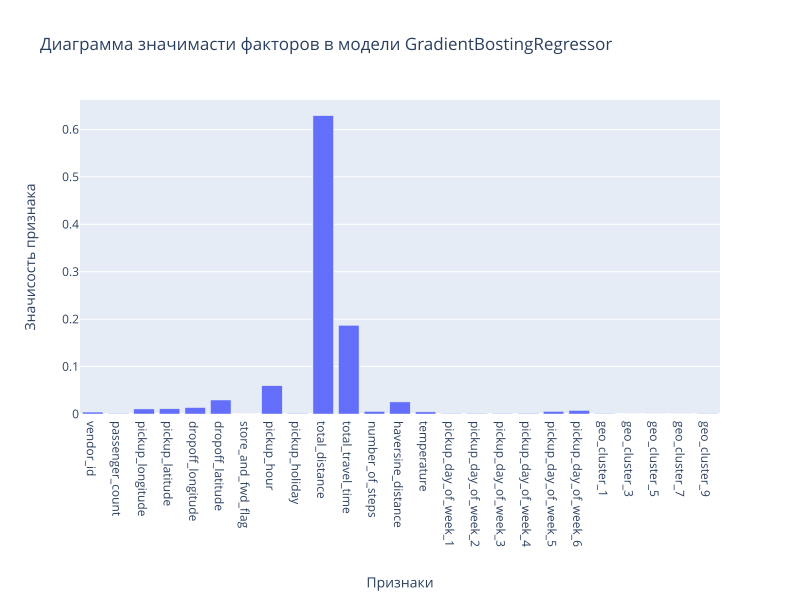

In [262]:

fig = px.bar(x=selector.get_feature_names_out(),
       y=model.feature_importances_,
       labels={'x':'Признаки','y':'Значисость признака'},
       title="Диаграмма значимасти факторов в модели GradientBostingRegressor",
       width=800,
       height=600
       )
fig.show(PX_MODE)


In [263]:
print('Топ-3 значимых признаков: total_distance, total_travel_time, pickup_hour') 

Топ-3 значимых признаков: total_distance, total_travel_time, pickup_hour


In [264]:
print(f'Медианная абсолютную ошибка: {median_absolute_error(np.exp(y_valid_log)-1,np.exp(y_valid_log_pred_GBR)-1) / 60:.1f}')


Медианная абсолютную ошибка: 1.8


Финальный шаг - сделать submit -  предсказание для отложенного тестового набора данных. 

Прочитаем тестовые данные и заранее выделим столбец с идентификаторами поездок из тестового набора данных. Он нам еще пригодится:


In [265]:
test_data = pd.read_csv("data/test_data.csv")
osrm_data_test = pd.read_csv("data/osrm_data_test.csv")
test_id = test_data['id']

Перед созданием прогноза для тестовой выборки необходимо произвести все манипуляции с данными, которые мы производили с тренировочной выборкой, а именно:
* Перевести признак pickup_datetime в формат datetime;
* Добавить новые признаки (временные, географические, погодные и другие факторы);
* Произвести очистку данных от пропусков;
* Произвести кодировку категориальных признаков:
    * Закодировать бинарные признаки;
    * Закодировать номинальные признаки с помощью обученного на тренировочной выборке OneHotEncoder’а;
* Сформировать матрицу наблюдений, оставив в таблице только те признаки, которые были отобраны с помощью SelectKBest;
* Нормализовать данные с помощью обученного на тренировочной выборке MinMaxScaler’а.


In [266]:
test_data['pickup_datetime']=pd.to_datetime(test_data['pickup_datetime'],format='%Y-%m-%d %H:%M:%S')
test_data = add_datetime_features(test_data)
test_data = add_holiday_features(test_data, holiday_data)
test_data = add_osrm_features(test_data, osrm_data_test)
test_data = add_geographical_features(test_data)
test_data = add_cluster_features(test_data, kmeans)
test_data = add_weather_features(test_data, weather_data)
test_data = fill_null_weather_data(test_data)

test_data['vendor_id'] = test_data['vendor_id'].apply(lambda x: 0 if x == 1 else 1)
test_data['store_and_fwd_flag'] = test_data['store_and_fwd_flag'].apply(lambda x: 0 if x == 'N' else 1)
test_data_onehot = one_hot_encoder.fit_transform(test_data[columns_to_change]).toarray()
column_names = one_hot_encoder.get_feature_names_out(columns_to_change)
test_data_onehot = pd.DataFrame(test_data_onehot, columns=column_names)

test_data = pd.concat(
    [test_data.reset_index(drop=True).drop(columns_to_change, axis=1), test_data_onehot], 
    axis=1
)
X_test = test_data[best_features]
X_test_scaled = scaler.transform(X_test)
print('Shape of data: {}'.format(X_test.shape))

Shape of data: (625134, 25)


In [267]:
y_test_predict = np.exp(model.predict(X_test_scaled)) - 1

Только после выполнения всех этих шагов можно сделать предсказание длительности поездки для тестовой выборки. Не забудем перевести предсказания из логарифмического масштаба в истинный, используя формулу:
$$y_i=exp(z_i)-1$$

После необходимо будет создать submission-файл в формате csv, отправить его на платформу Kaggle и посмотреть на результирующее значение метрики RMSLE на тестовой выборке.



In [268]:
submission = pd.DataFrame({'id': test_id, 'trip_duration': y_test_predict})
submission.to_csv('data/submission_gb.csv', index=False)

### XGBoost

В завершение по ансамблевым попробуем улучшить свое предсказание, воспользовавшись моделью экстремального градиентного бустинга (XGBoost) из библиотеки xgboost.

**XGBoost** - современная модель машинного обучения, которая является продолжением идеи градиентного бустинга Фридмана. У нее есть несколько преимуществ по сравнению с классической моделью градиентного бустинга из библиотеки sklearn: повышенная производительность путем параллелизации процесса обучения, повышенное качество решения за счет усовершенствования алгоритма бустинга, меньшая склонность к переобучению и широкий функционал возможности управления параметрами модели.


Перед обучением модели необходимо перевести наборы данных в тип данных xgboost.DMatrix:

In [269]:
# Создание матриц наблюдений в формате DMatrix
dtrain = xgb.DMatrix(X_train_scaled, label=y_train_log, feature_names=best_features)
dvalid = xgb.DMatrix(X_valid_scaled, label=y_valid_log, feature_names=best_features)
dtest = xgb.DMatrix(X_test_scaled, feature_names=best_features)

Обучение модели XGBoost происходит с помощью метода train, в который необходимо передать параметры модели, набор данных, количество базовых моделей в ансамбле, а также дополнительные параметры:


In [270]:
# Гиперпараметры модели
xgb_pars = {'min_child_weight': 20, 'eta': 0.1, 'colsample_bytree': 0.9, 
            'max_depth': 6, 'subsample': 0.9, 'lambda': 1, 'nthread': -1, 
            'booster' : 'gbtree', 'eval_metric': 'rmse', 'objective': 'reg:squarederror'
           }
# Тренировочная и валидационная выборка
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]
eval={}
# Обучаем модель XGBoost

model = xgb.train(
    params=xgb_pars, #гиперпараметры модели
    dtrain=dtrain, #обучающая выборка
    num_boost_round=800, #количество моделей в ансамбле
    evals=watchlist, #выборки, на которых считается матрица
    early_stopping_rounds=20, #раняя остановка
    maximize=False, #смена поиска максимума на минимум
    verbose_eval=10, #шаг, через который происходит отображение метрик
    evals_result=eval
)

[0]	train-rmse:5.42218	valid-rmse:5.42190
[10]	train-rmse:1.93577	valid-rmse:1.93572
[20]	train-rmse:0.78516	valid-rmse:0.78602
[30]	train-rmse:0.47918	valid-rmse:0.48121
[40]	train-rmse:0.42142	valid-rmse:0.42405
[50]	train-rmse:0.40929	valid-rmse:0.41237
[60]	train-rmse:0.40478	valid-rmse:0.40826
[70]	train-rmse:0.40168	valid-rmse:0.40561
[80]	train-rmse:0.39942	valid-rmse:0.40364
[90]	train-rmse:0.39752	valid-rmse:0.40209
[100]	train-rmse:0.39572	valid-rmse:0.40058
[110]	train-rmse:0.39410	valid-rmse:0.39932
[120]	train-rmse:0.39331	valid-rmse:0.39879
[130]	train-rmse:0.39201	valid-rmse:0.39783
[140]	train-rmse:0.39096	valid-rmse:0.39711
[150]	train-rmse:0.38999	valid-rmse:0.39655
[160]	train-rmse:0.38924	valid-rmse:0.39606
[170]	train-rmse:0.38852	valid-rmse:0.39567
[180]	train-rmse:0.38786	valid-rmse:0.39524
[190]	train-rmse:0.38716	valid-rmse:0.39492
[200]	train-rmse:0.38645	valid-rmse:0.39447
[210]	train-rmse:0.38563	valid-rmse:0.39400
[220]	train-rmse:0.38505	valid-rmse:0.39372

Предсказать целевой признак на новых данных можно с помощью метода predict():

In [271]:
#Делаем предсказание на тестовом наборе данных
y_test_predict = np.exp(model.predict(dtest)) - 1
print('Modeling RMSLE %.5f' % model.best_score)

Modeling RMSLE 0.38767


In [272]:
results.loc['XGBOOST',:] = eval['train']['rmse'][model.best_iteration], eval['valid']['rmse'][model.best_iteration], None, None
results

,RMSLE на тренировочной выборке,RMSLE на валидационной выборке,R2 на тренировочной выборке,R2 на валидационной выборке
linear,0.535644,0.538098,0.542402,0.540438
polynom^2,0.466375,0.700346,0.653102,0.221522
l2-regular. polynom^2,0.471302,0.475533,0.645734,0.641092
DecisionTree,0.405894,0.430348,0.737241,0.706059
RandomForest,0.399149,0.414041,0.745902,0.727913
GradBoost,0.371837,0.394137,0.779485,0.753444
XGBOOST,0.36797,0.387667,None,None
LGBM,NaN,NaN,NaN,NaN


Также как и все модели, основанные на использовании деревьев решений в качестве базовых моделей, XGBoost имеет возможность определения коэффициентов важности факторов. Более того, в библиотеку встроена возможность визуализации важность факторов в виде столбчатой диаграммы. За эту возможность отвечает функция plot_importance():


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

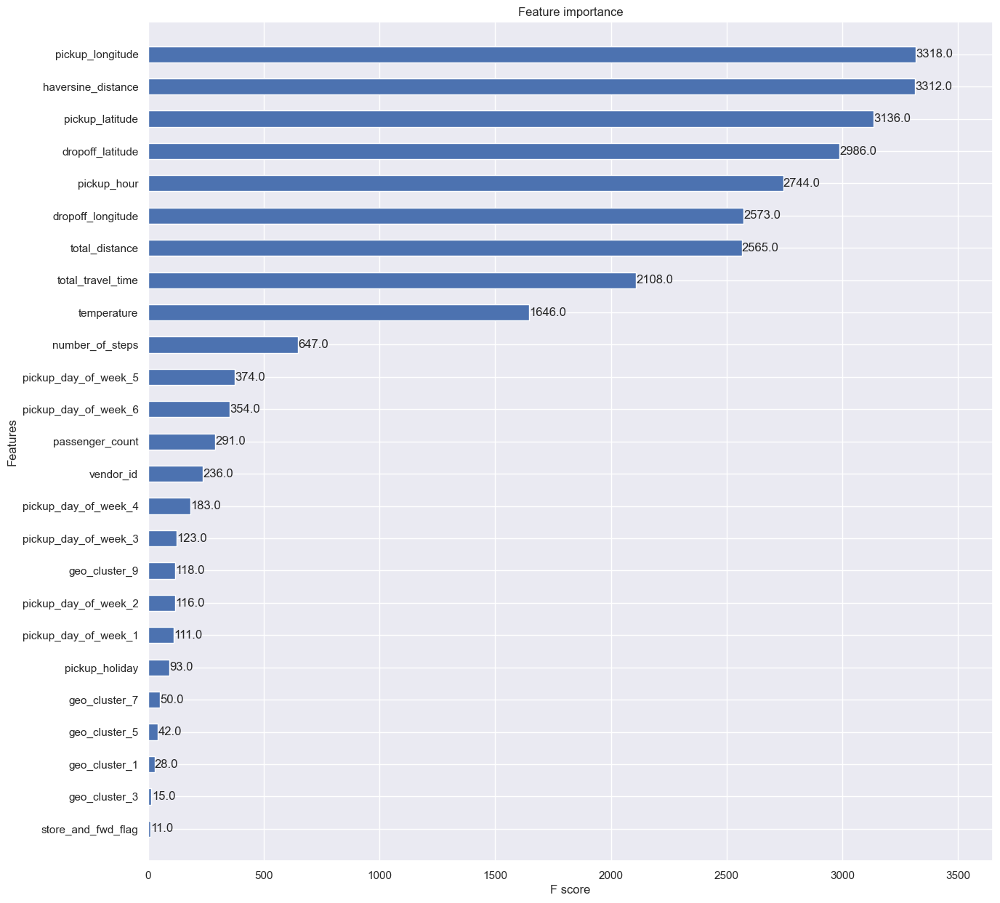

In [273]:
fig, ax = plt.subplots(figsize = (15,15))
xgb.plot_importance(model, ax = ax, height=0.5)

In [274]:
submission = pd.DataFrame({'id': test_id, 'trip_duration': y_test_predict})
submission.to_csv('data/submission_XGB.csv', index=False)

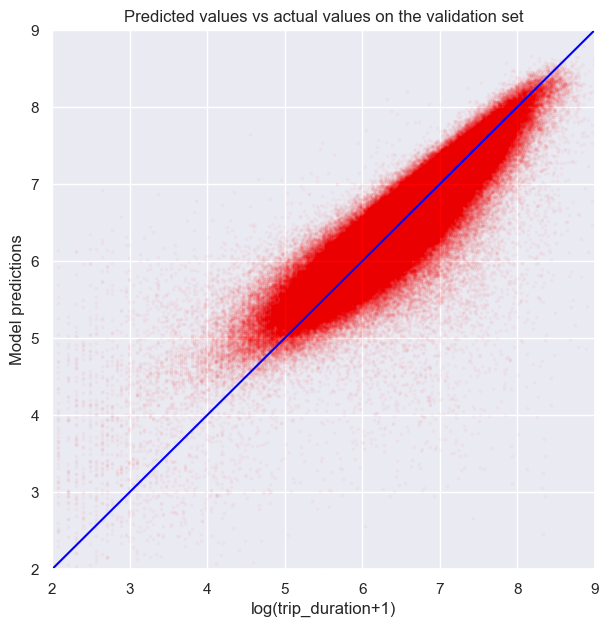

In [275]:
sns.set(font_scale=1)
plt.figure(figsize=(7, 7))
plt.scatter(y_valid_log, model.predict(dvalid), s=3, color='red', alpha=0.025)
plt.plot([1,9],[1,9], color='blue')
plt.title('Predicted values vs actual values on the validation set')
plt.xlabel('log(trip_duration+1)')
plt.ylabel('Model predictions')
axes = plt.gca()
axes.set_xlim([2, 9])
axes.set_ylim([2, 9])
plt.show()
plt.show()

### LGBM

In [276]:
# Тренировочная и валидационная выборка
train_data = lgbm.Dataset(X_train_scaled, y_train_log)
eval_data = lgbm.Dataset(X_valid_scaled, y_valid_log)
params = {
    'objective': 'regression',
    'metric' : 'rmse',
    'learning_rate': 0.1,
    'max_depth': 25,
    'num_leaves': 1000, 
    'feature_fraction': 0.9,
    'bagging_fraction': 0.5,
    'max_bin': 1000 ,
    'num_threads' : -1}
model = lgbm.train(params, train_data, num_boost_round=1500, valid_sets= (train_data, eval_data),
                early_stopping_rounds=100, verbose_eval=100)
             
y_pred_log = model.predict(X_valid_scaled, num_iteration = model.best_iteration)

Training until validation scores don't improve for 100 rounds
[100]	training's rmse: 0.324492	valid_1's rmse: 0.378679
[200]	training's rmse: 0.297728	valid_1's rmse: 0.376924
[300]	training's rmse: 0.27932	valid_1's rmse: 0.376595
Early stopping, best iteration is:
[294]	training's rmse: 0.280328	valid_1's rmse: 0.376581


In [277]:
y_test_predict = np.exp(model.predict(X_test_scaled, num_iteration = model.best_iteration)) - 1
submission = pd.DataFrame({'id': test_id, 'trip_duration': y_test_predict})
submission.to_csv('data/submission_lGBM.csv', index=False)


In [278]:
results.loc['LGBM',:] = model.best_score['training']['rmse'], model.best_score['valid_1']['rmse'], None, None
results

,RMSLE на тренировочной выборке,RMSLE на валидационной выборке,R2 на тренировочной выборке,R2 на валидационной выборке
linear,0.535644,0.538098,0.542402,0.540438
polynom^2,0.466375,0.700346,0.653102,0.221522
l2-regular. polynom^2,0.471302,0.475533,0.645734,0.641092
DecisionTree,0.405894,0.430348,0.737241,0.706059
RandomForest,0.399149,0.414041,0.745902,0.727913
GradBoost,0.371837,0.394137,0.779485,0.753444
XGBOOST,0.36797,0.387667,None,None
LGBM,0.280328,0.376581,None,None


## Итог
Результат ~ (в топ 19% соревнования) на KAGGLE c SCORE RMSE = 0.38455 на LGMB (0.39453 на XGB, 0.4 на GradientBostingRegressor).

Еще, на мой взгляд, модель можно было улучшить:
- поработать с аномалиями, например с помощью Isolation Forest
- попробовать другие scalers
- тонкой настройкой параметров
- разбить датасет на несколько, например, по признаку длительности поездки и расстояния и обучить по модели на каждый, так как зависисмости таргета от признака в этих группах немного различаются